Reading shapefile: /Users/himanshunimonkar/Downloads/STA_220/shapefiles/nps_boundary.shp
Total features: 437
CRS: EPSG:4269
Column names:
- OBJECTID
- UNIT_CODE
- GIS_Notes
- UNIT_NAME
- DATE_EDIT
- STATE
- REGION
- GNIS_ID
- UNIT_TYPE
- CREATED_BY
- METADATA
- PARKNAME
- CreationDa
- Creator
- EditDate
- Editor
- GlobalID
- Shape_Leng
- Shape_Area
- geometry

Filtering for National Parks in California...
Number of California National Parks: 9
Park names:
- Pinnacles National Park
- Channel Islands National Park
- Death Valley National Park
- Joshua Tree National Park
- Lassen Volcanic National Park
- Redwood National Park
- Sequoia National Park
- Kings Canyon National Park
- Yosemite National Park

Exporting to GeoJSON: /Users/himanshunimonkar/Downloads/STA_220/shapefiles/california_national_parks.geojson
Process complete. GeoJSON file saved to: /Users/himanshunimonkar/Downloads/STA_220/shapefiles/california_national_parks.geojson
Map visualization saved as: /Users/himanshunimonkar/D

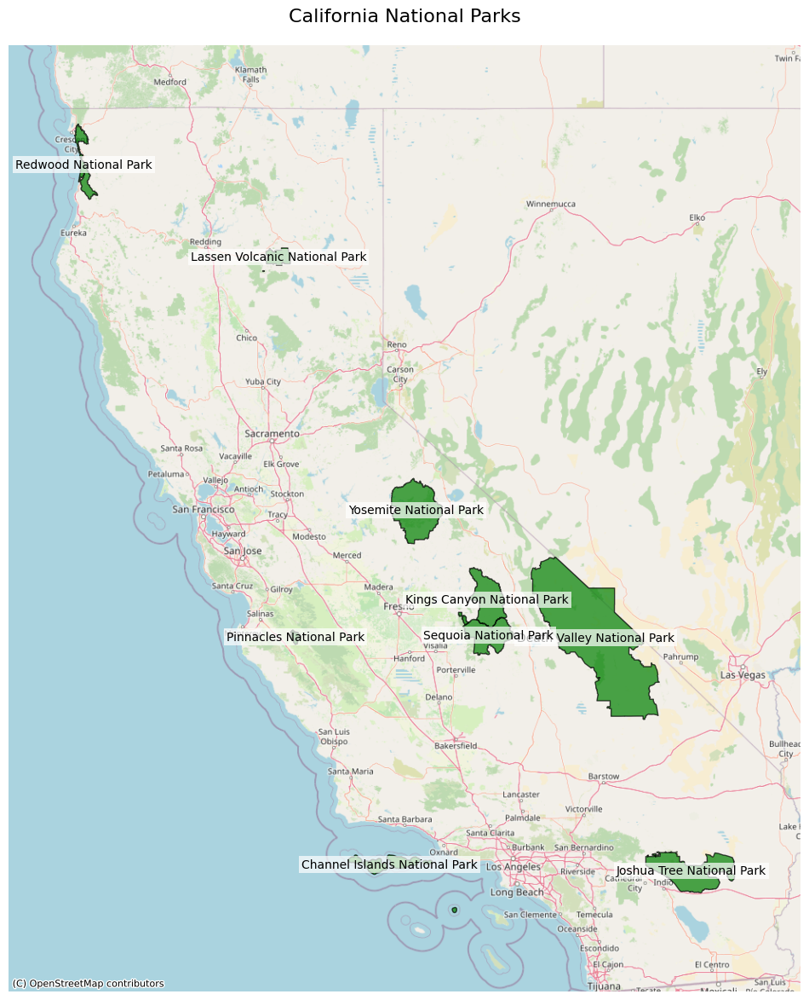

In [8]:
import geopandas as gpd
import os

# Update this path to the directory containing your shapefile components
shapefile_dir = "/Users/himanshunimonkar/Downloads/STA_220/shapefiles"
shapefile_name = "nps_boundary.shp"
shapefile_path = os.path.join(shapefile_dir, shapefile_name)

# Read the shapefile
print(f"Reading shapefile: {shapefile_path}")
nps_boundaries = gpd.read_file(shapefile_path)

# Show basic info about the shapefile
print(f"Total features: {len(nps_boundaries)}")
print(f"CRS: {nps_boundaries.crs}")
print("Column names:")
for col in nps_boundaries.columns:
    print(f"- {col}")

# Check if needed columns exist
required_columns = ['UNIT_TYPE', 'STATE', 'UNIT_NAME']
for col in required_columns:
    if col not in nps_boundaries.columns:
        print(f"WARNING: Required column '{col}' not found. Available columns: {nps_boundaries.columns.tolist()}")

# Filter for National Parks in California
print("\nFiltering for National Parks in California...")
california_national_parks = nps_boundaries[
    (nps_boundaries['UNIT_TYPE'] == 'National Park') & 
    (nps_boundaries['STATE'] == 'CA')
]

# Print information about the filtered dataset
print(f"Number of California National Parks: {len(california_national_parks)}")
if len(california_national_parks) > 0:
    print("Park names:")
    for name in california_national_parks['UNIT_NAME'].unique():
        print(f"- {name}")
else:
    print("\nNo parks found matching the criteria. Checking actual values in columns...")
    
    # If no parks found, show sample values to help debugging
    print("\nSample UNIT_TYPE values:")
    print(nps_boundaries['UNIT_TYPE'].unique()[:10])  # Show first 10 unique values
    
    print("\nSample STATE values:")
    print(nps_boundaries['STATE'].unique()[:10])  # Show first 10 unique values
    
    # Try alternative filtering approach
    print("\nTrying alternative filtering approach...")
    
    # Check for parks containing "National Park" in their name
    alt_california_parks = nps_boundaries[
        nps_boundaries['UNIT_NAME'].str.contains('National Park', case=False, na=False) & 
        (nps_boundaries['STATE'] == 'CA')
    ]
    
    if len(alt_california_parks) > 0:
        print(f"Found {len(alt_california_parks)} parks using name-based filtering:")
        for name in alt_california_parks['UNIT_NAME'].unique():
            print(f"- {name}")
        
        # Use this as our dataset
        california_national_parks = alt_california_parks
        print("\nUsing these parks for the export.")

# Define output path for GeoJSON
output_path = os.path.join(shapefile_dir, "california_national_parks.geojson")

# Export to GeoJSON
print(f"\nExporting to GeoJSON: {output_path}")
california_national_parks.to_file(output_path, driver='GeoJSON')

print(f"Process complete. GeoJSON file saved to: {output_path}")

# Create a simple visualization
# Replace the visualization part with this enhanced version
try:
    import matplotlib.pyplot as plt
    import contextily as ctx
    from matplotlib.colors import to_rgba
    import numpy as np
    
    # Make sure the CRS is in web mercator for contextily
    california_national_parks_web = california_national_parks.to_crs(epsg=3857)
    
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(12, 15))
    
    # Calculate the bounding box to focus on California
    # Either use the bounds of your parks with some padding:
    minx, miny, maxx, maxy = california_national_parks_web.total_bounds
    # Add padding (10% of width/height)
    w, h = maxx - minx, maxy - miny
    minx -= w * 0.1
    maxx += w * 0.1
    miny -= h * 0.1
    maxy += h * 0.1
    
    # Plot the parks
    california_national_parks_web.plot(
        ax=ax,
        color='green',
        edgecolor='black',
        alpha=0.7,
        linewidth=1
    )
    
    # Add park labels
    for idx, row in california_national_parks_web.iterrows():
        # Get the centroid of each park
        centroid = row.geometry.centroid
        # Create a white background for the text
        ax.text(centroid.x, centroid.y, row['UNIT_NAME'], 
                fontsize=10, ha='center', va='center', 
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=2),
                zorder=5)  # Ensure text is on top
    
    # Add the OpenStreetMap basemap
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
    
    # Set the extent to focus on California
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    
    # Add title
    plt.title('California National Parks', fontsize=16, pad=20)
    
    # Remove axis labels
    ax.set_axis_off()
    
    # Save the visualization
    map_output = os.path.join(shapefile_dir, "california_national_parks_osm_map.png")
    plt.savefig(map_output, dpi=300, bbox_inches='tight')
    print(f"Map visualization saved as: {map_output}")
    
except Exception as e:
    print(f"Could not generate map with OpenStreetMap: {str(e)}")
    print("Make sure you have the contextily package installed ('pip install contextily')")

In [12]:
import pandas as pd
import os
import glob
import re

# Define folder path where the CSV files are located
data_folder = "/Users/himanshunimonkar/Downloads/STA_220/crash-data"  # Update this to your folder path

# Define mapping for file prefixes to park names
park_mapping = {
    "Death_Valley": "Death_Valley",
    "Joshua_Tree": "Joshua_Tree",
    "Kings_Canyon": "Kings_Canyon",
    "Lassen": "Lassen_Volcanic",
    "Pinnacles": "Pinnacles",
    "Redwood": "Redwood",
    "Sequoia": "Sequoia",
    "yosemite": "Yosemite"
}

# Function to extract national park name from filename
def get_park_name(filename):
    for prefix, park_name in park_mapping.items():
        if filename.startswith(prefix):
            return park_name
    return "Unknown"  # Fallback if pattern doesn't match

# Dictionary to store combined dataframes for each park
park_dataframes = {}

# Step 1: Group and combine files by national park
print("Step 1: Combining files by national park...")
csv_files = glob.glob(os.path.join(data_folder, "*.csv"))

for file_path in csv_files:
    filename = os.path.basename(file_path)
    park_name = get_park_name(filename)
    
    try:
        # Read the CSV file
        df = pd.read_csv(file_path, low_memory=False)
        
        # Extract only the required columns
        if all(col in df.columns for col in ['ACCIDENT_YEAR', 'COLLISION_DATE', 'LATITUDE', 'LONGITUDE']):
            df = df[['ACCIDENT_YEAR', 'COLLISION_DATE', 'LATITUDE', 'LONGITUDE']]
            
            # Remove rows where LATITUDE or LONGITUDE is missing
            df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])
            
            # Add to the corresponding park dataframe
            if park_name in park_dataframes:
                park_dataframes[park_name] = pd.concat([park_dataframes[park_name], df], ignore_index=True)
            else:
                park_dataframes[park_name] = df
                
            print(f"Successfully processed: {filename}")
        else:
            missing_cols = [col for col in ['ACCIDENT_YEAR', 'COLLISION_DATE', 'LATITUDE', 'LONGITUDE'] if col not in df.columns]
            print(f"Warning: {filename} is missing required columns: {missing_cols}")
            
    except Exception as e:
        print(f"Error processing {filename}: {str(e)}")

# Step 2: Process each park's dataframe
final_dataframes = []

print("\nStep 2: Processing data for each national park...")
for park_name, df in park_dataframes.items():
    try:
        print(f"Processing {park_name}...")
        
        # Convert COLLISION_DATE to datetime
        df['COLLISION_DATE'] = pd.to_datetime(df['COLLISION_DATE'], errors='coerce')
        
        # Filter out invalid dates and years outside range
        df = df.dropna(subset=['COLLISION_DATE'])
        df = df[(df['COLLISION_DATE'] >= '2015-01-01') & (df['COLLISION_DATE'] <= '2024-12-31')]
        
        # Extract month and create new column
        df['MONTH'] = df['COLLISION_DATE'].dt.month
        
        # Sort by date
        df = df.sort_values('COLLISION_DATE')
        
        # Drop the original COLLISION_DATE column
        df = df[['ACCIDENT_YEAR', 'MONTH', 'LATITUDE', 'LONGITUDE']]
        
        # Add National Park column
        df['NATIONAL_PARK'] = park_name
        
        # Add to final list
        final_dataframes.append(df)
        print(f"Successfully processed {len(df)} records for {park_name}")
        
    except Exception as e:
        print(f"Error processing data for {park_name}: {str(e)}")

# Step 3: Combine all dataframes
print("\nStep 3: Combining all data into one dataset...")
if final_dataframes:
    combined_df = pd.concat(final_dataframes, ignore_index=True)
    
    # Sort the final dataframe by national park and date
    combined_df = combined_df.sort_values(['NATIONAL_PARK', 'ACCIDENT_YEAR', 'MONTH'])
    
    # Save to CSV
    output_path = os.path.join(data_folder, "combined_national_parks_crashes.csv")
    combined_df.to_csv(output_path, index=False)
    print(f"\nSuccess! Combined data saved to: {output_path}")
    print(f"Total records: {len(combined_df)}")
    print(f"Records by park:")
    for park in combined_df['NATIONAL_PARK'].unique():
        count = len(combined_df[combined_df['NATIONAL_PARK'] == park])
        print(f"- {park}: {count} records")
else:
    print("No data to combine. Please check your input files.")

print("\nProcessing complete!")


Step 1: Combining files by national park...
Successfully processed: Lassen_Crashes_P_36,89.csv
Successfully processed: Death_Valley_Crashes_6,127,168,190,395.csv
Successfully processed: Redwood_Crashes_H_101.csv
Successfully processed: Redwood_Crashes_D_101,199.csv
Successfully processed: yosemite_crashes.csv
Successfully processed: Lassen_Crashes_S_36,44,89.csv
Successfully processed: Pinnacles_Crashes_S_25.csv
Successfully processed: Lassen_Crashes_L_36,44.csv
Successfully processed: Sequoia_Crashes_T_198,216.csv
Successfully processed: Pinnacles_Crashes_M_146.csv
Successfully processed: Lassen_Crashes_32,36,89.csv
Successfully processed: Kings_Canyon_Crashes_F_180.csv
Successfully processed: Joshua_Tree_Crashes_1.csv
Successfully processed: Joshua_Tree_Crashes_2.csv

Step 2: Processing data for each national park...
Processing Lassen_Volcanic...
Successfully processed 1127 records for Lassen_Volcanic
Processing Death_Valley...
Successfully processed 575 records for Death_Valley
Proc

Map with collisions saved as: /Users/himanshunimonkar/Downloads/STA_220/shapefiles/california_parks_collisions_map.png


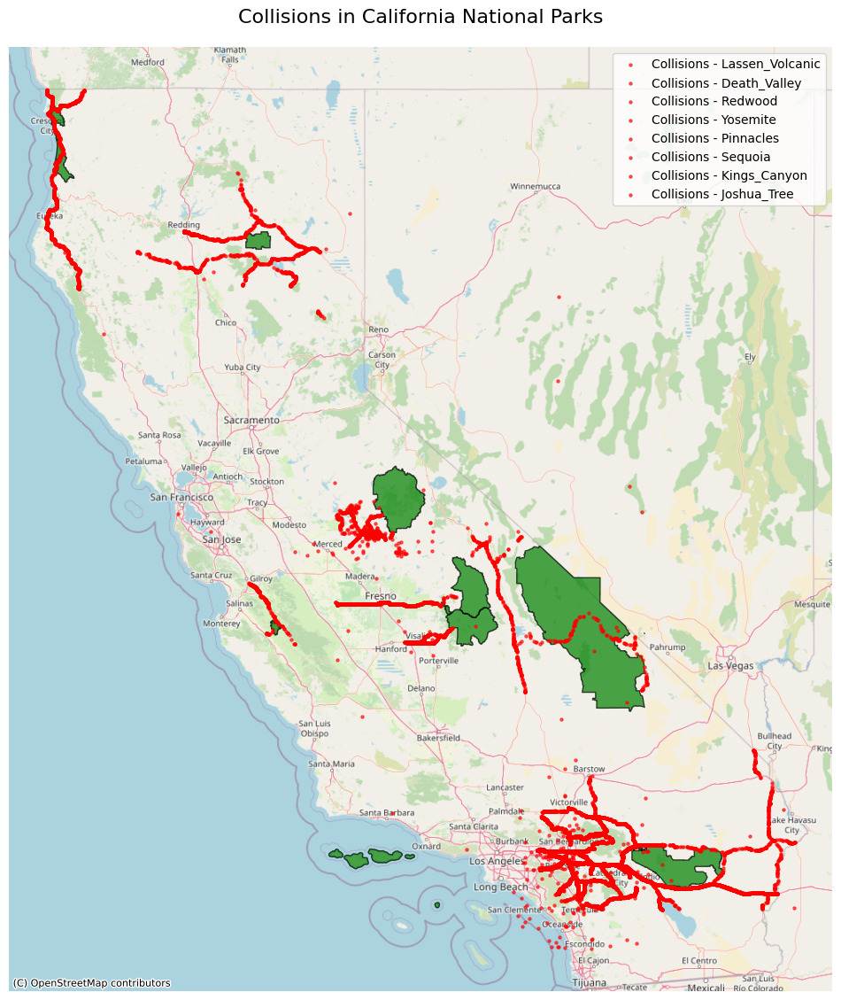

In [13]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point

# Function to convert a DataFrame with LATITUDE/LONGITUDE to a GeoDataFrame
def df_to_geodf(df, lat_col='LATITUDE', lon_col='LONGITUDE', crs="EPSG:4326"):
    geometry = [Point(xy) for xy in zip(df[lon_col], df[lat_col])]
    return gpd.GeoDataFrame(df, geometry=geometry, crs=crs)

# Load the California National Parks map (assuming you've done this already)
california_national_parks = gpd.read_file("/Users/himanshunimonkar/Downloads/STA_220/shapefiles/california_national_parks.geojson")

# Convert to web mercator for compatibility with contextily basemap
california_national_parks_web = california_national_parks.to_crs(epsg=3857)

# Assume park_dataframes is already populated from your previous code
# Now convert each park's collision data into a GeoDataFrame
collision_geodfs = {}
for park_name, df in park_dataframes.items():
    collision_geodfs[park_name] = df_to_geodf(df)

# Visualize the collisions on the map
fig, ax = plt.subplots(figsize=(12, 15))

# Plot the California National Parks
california_national_parks_web.plot(ax=ax, color='green', edgecolor='black', alpha=0.7)

# Plot collisions for each park
for park_name, geodf in collision_geodfs.items():
    # Convert to web mercator projection for visualization
    geodf_web = geodf.to_crs(epsg=3857)
    
    # Plot collisions as red dots
    geodf_web.plot(ax=ax, marker='o', color='red', markersize=5, alpha=0.6, label=f'Collisions - {park_name}')

# Add OpenStreetMap basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Add title
plt.title('Collisions in California National Parks', fontsize=16, pad=20)

# Add a legend to differentiate parks and collisions
plt.legend()

# Remove axis labels
ax.set_axis_off()

# Save the updated visualization
map_output = os.path.join("/Users/himanshunimonkar/Downloads/STA_220/shapefiles", "california_parks_collisions_map.png")
plt.savefig(map_output, dpi=300, bbox_inches='tight')

print(f"Map with collisions saved as: {map_output}")



===== Processing Death_Valley =====


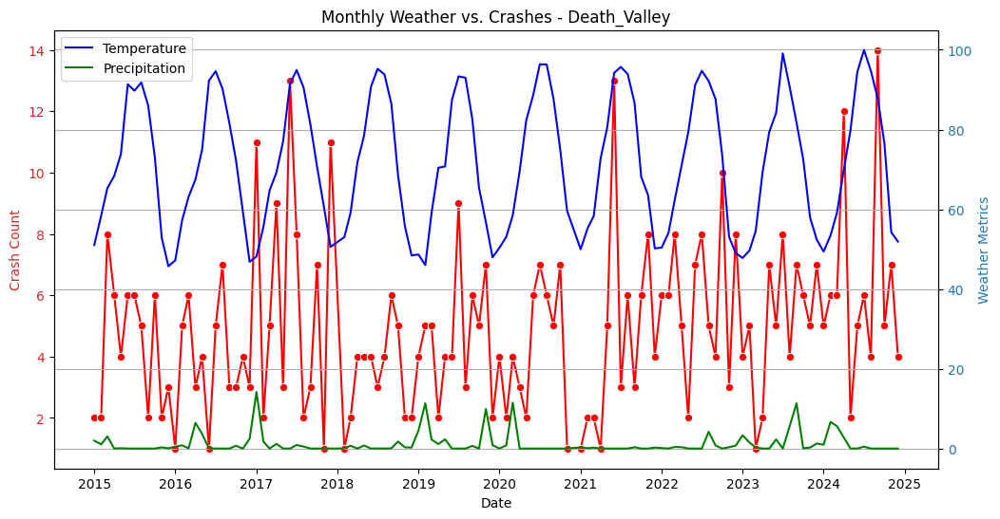

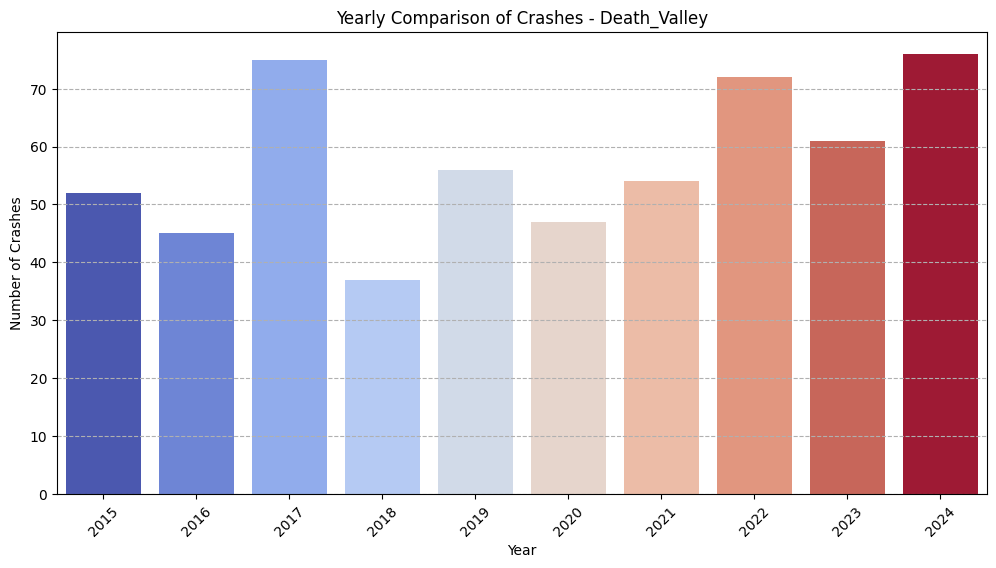

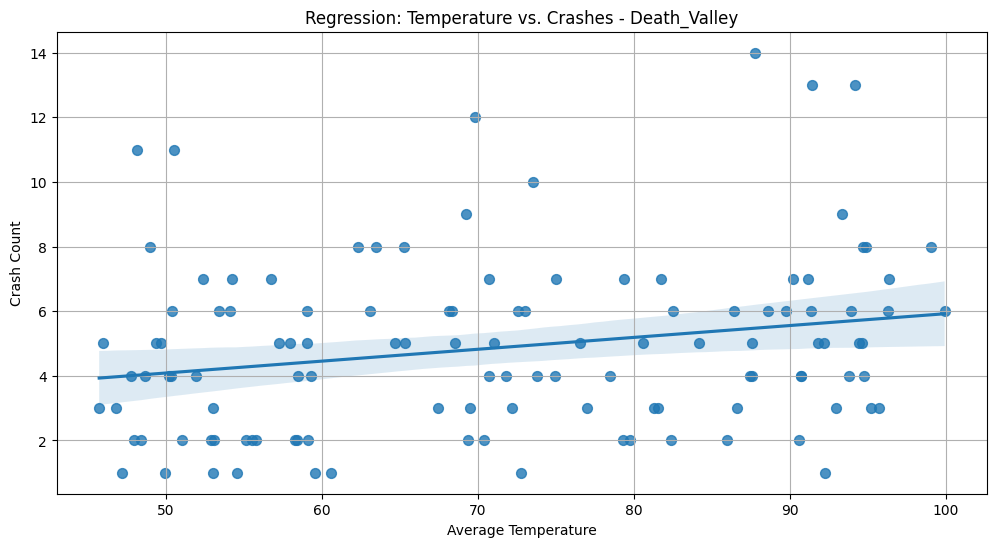

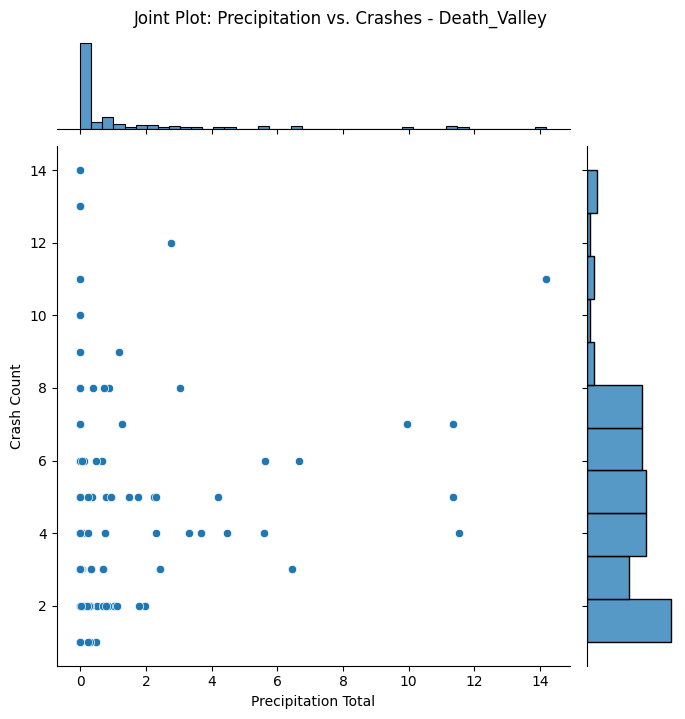

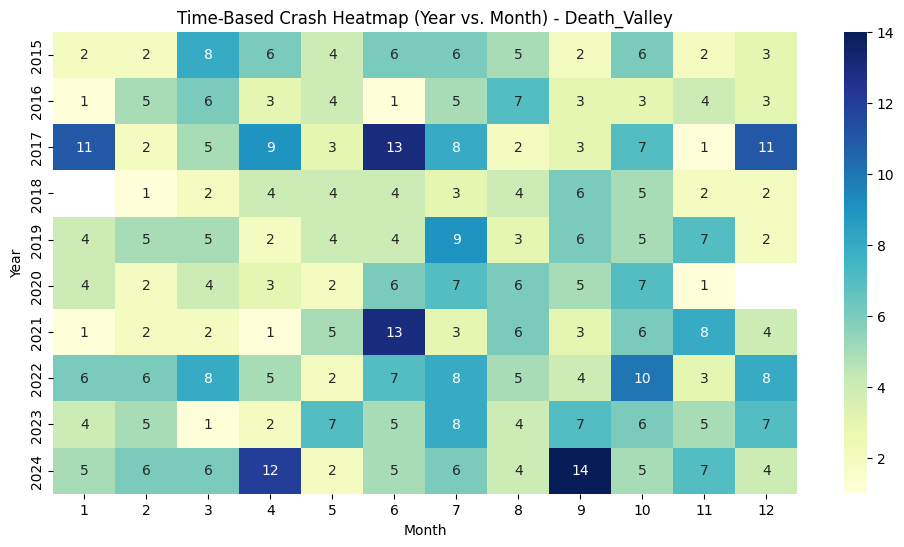

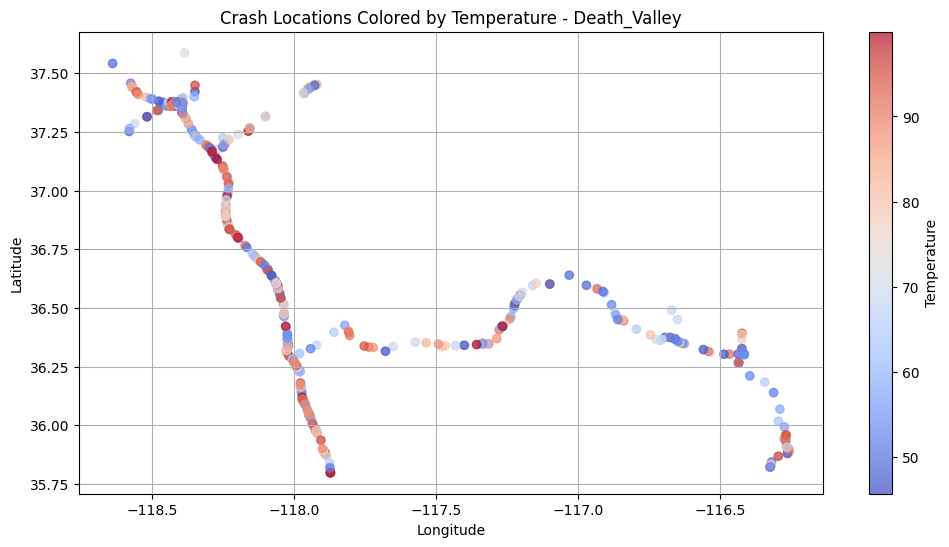

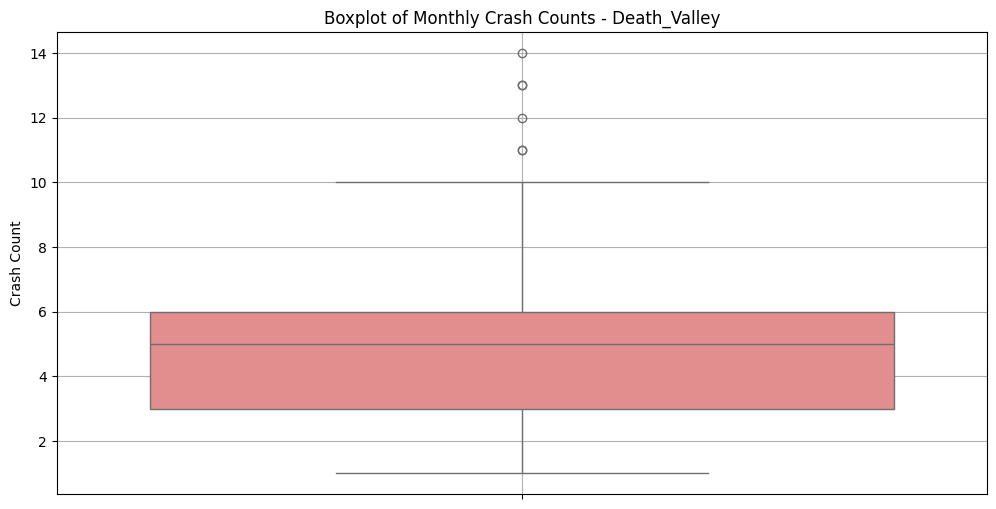


===== Processing Joshua_Tree =====


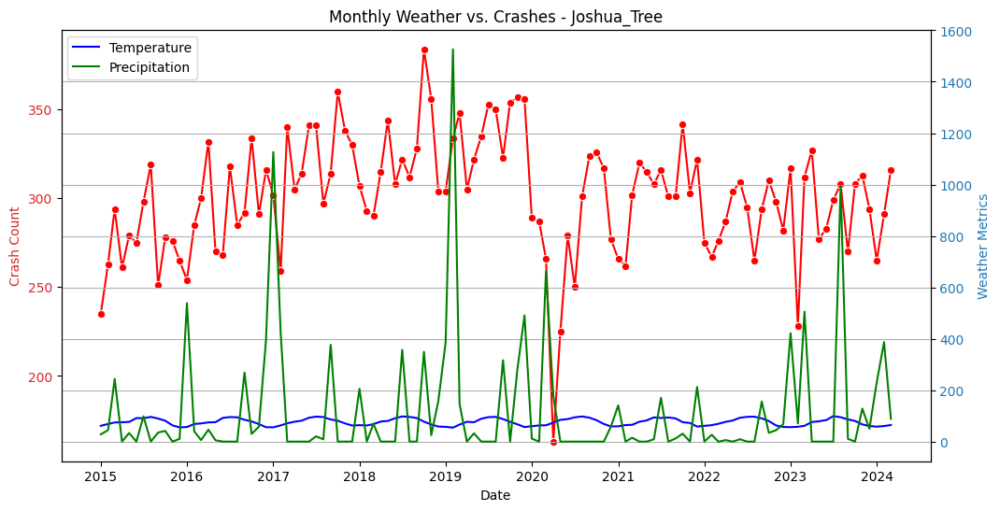

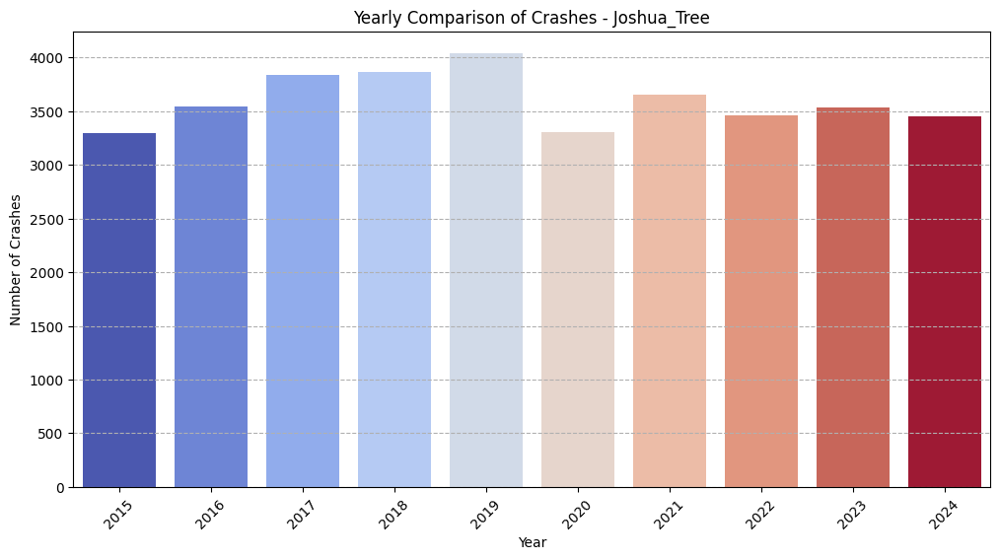

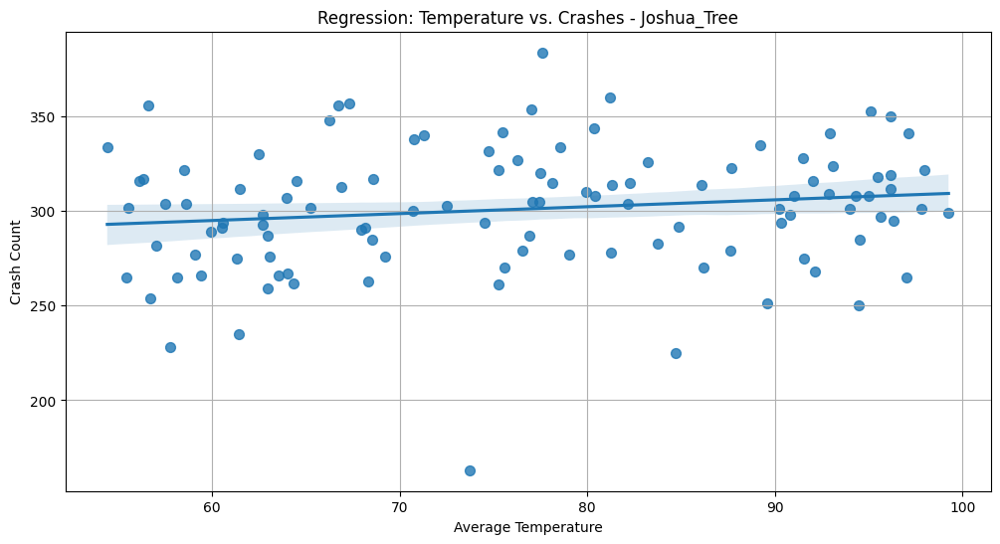

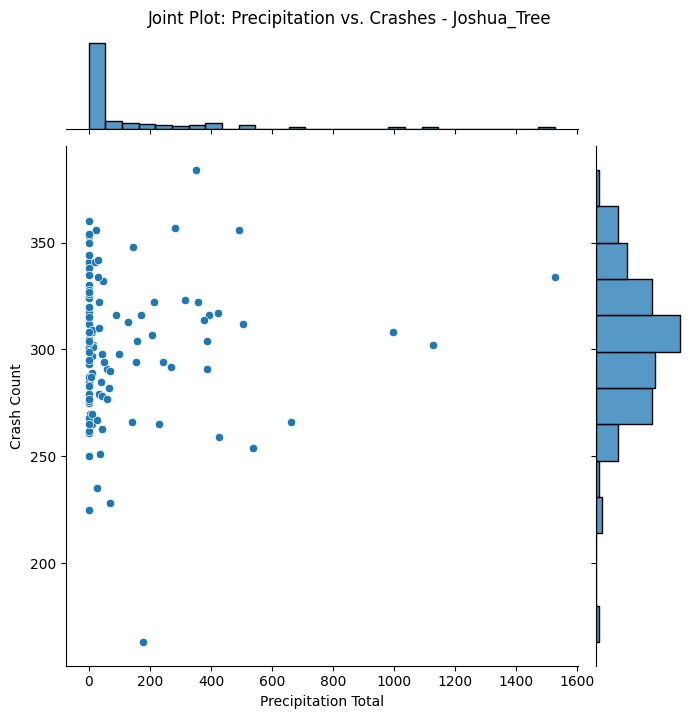

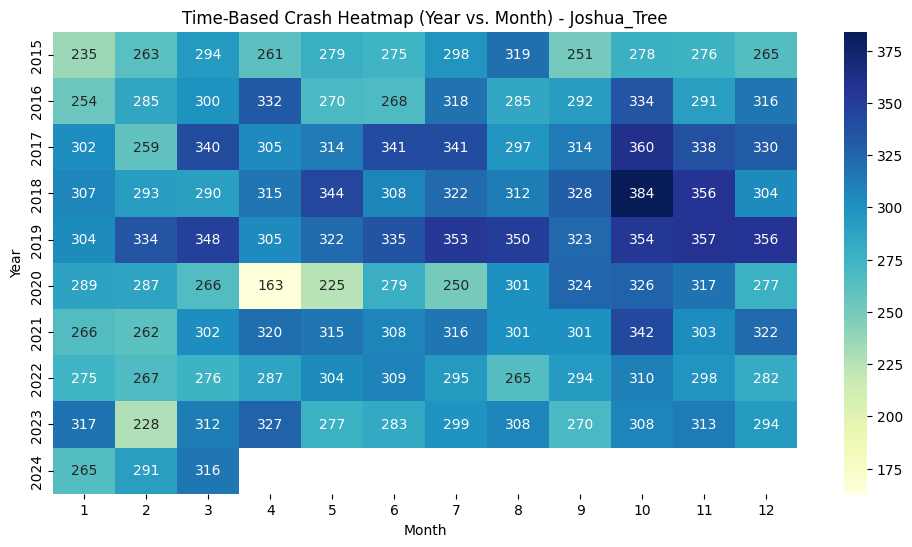

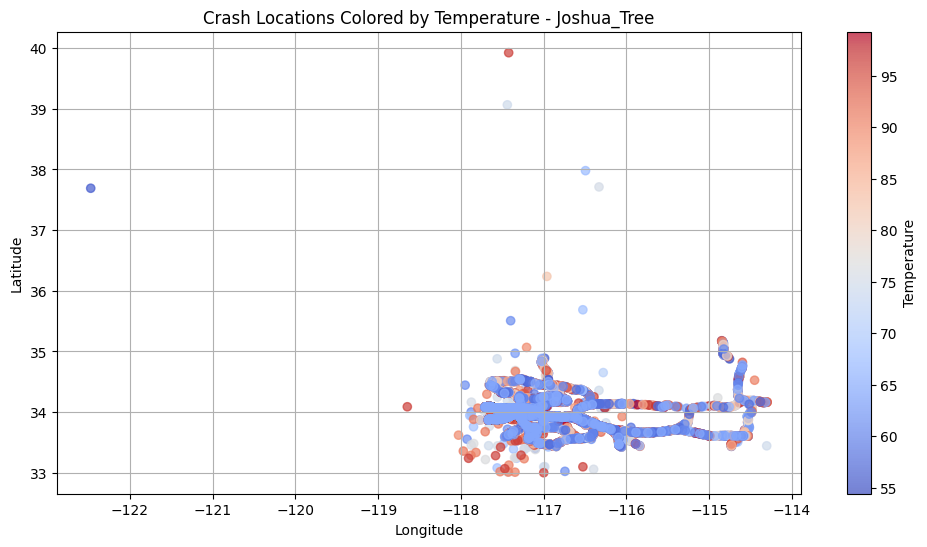

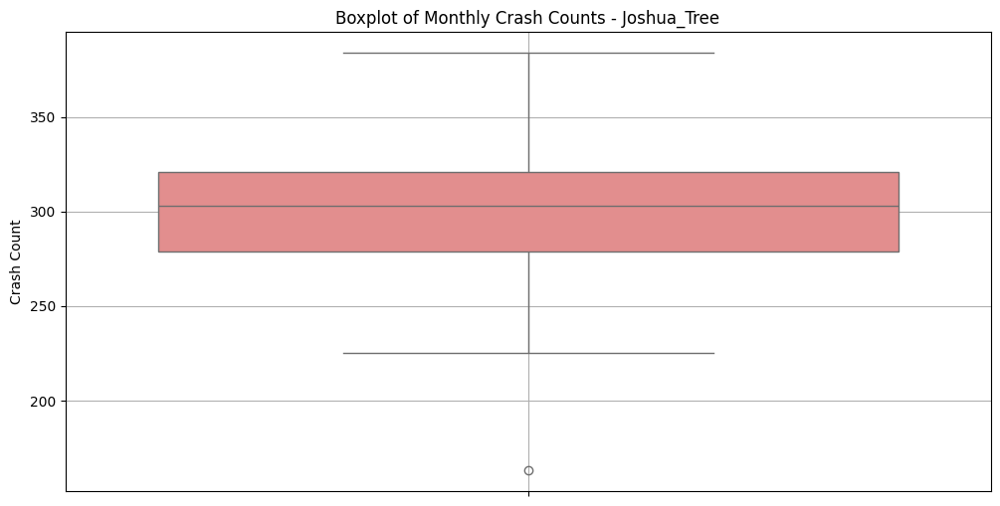


===== Processing Kings_Canyon =====


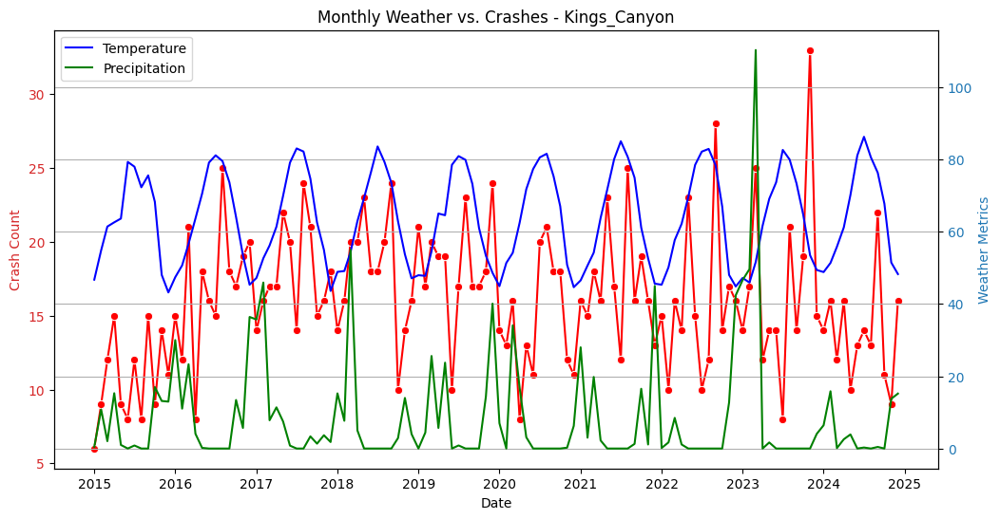

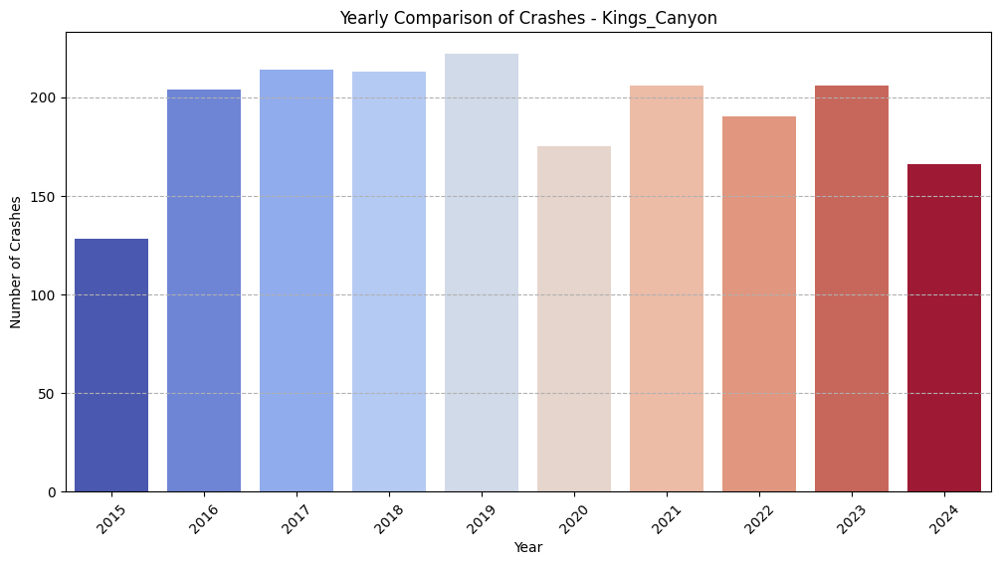

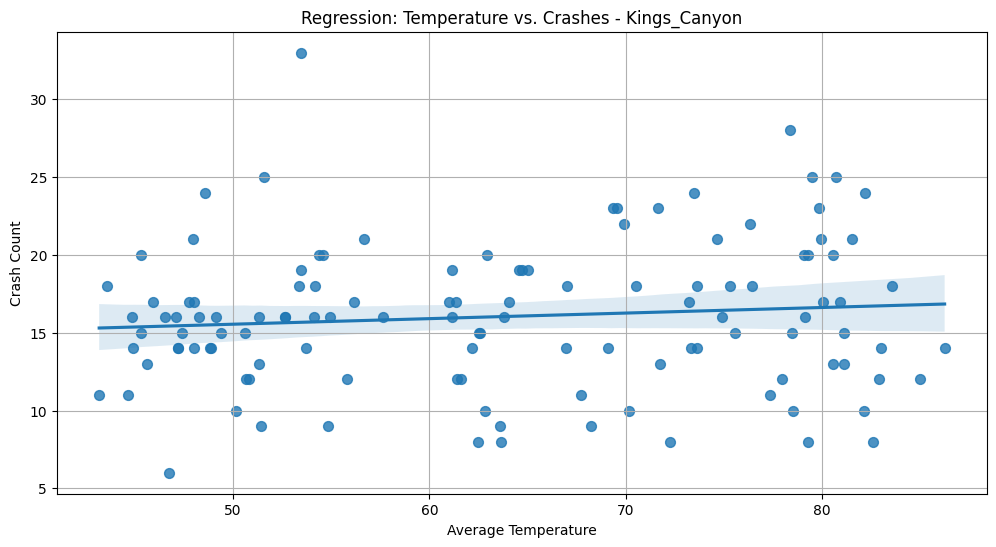

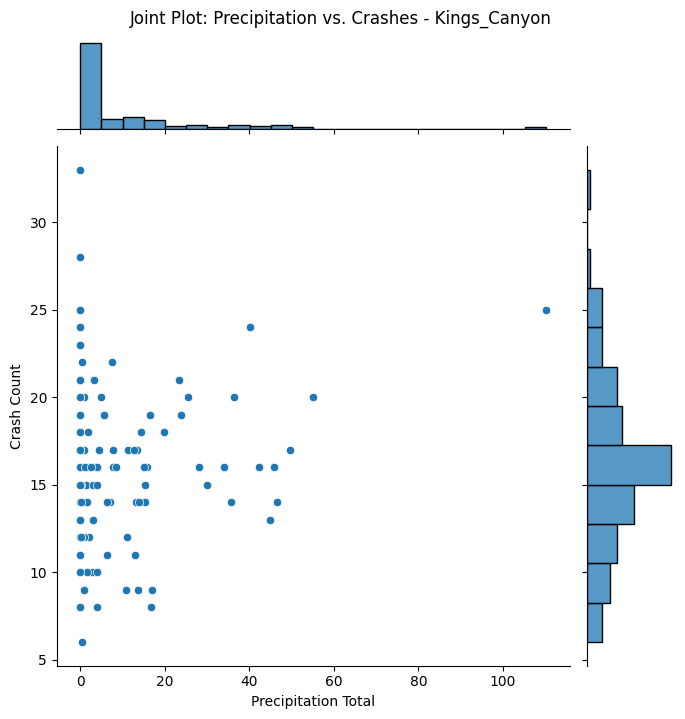

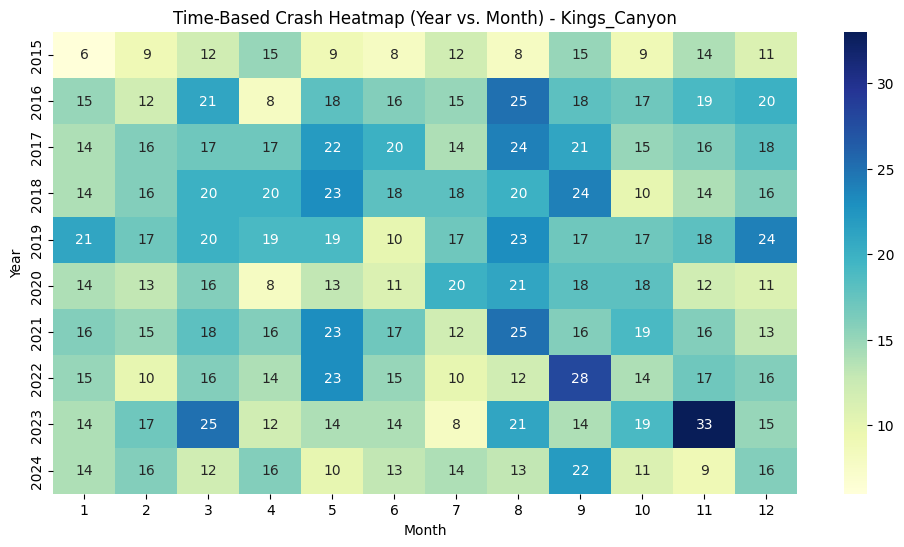

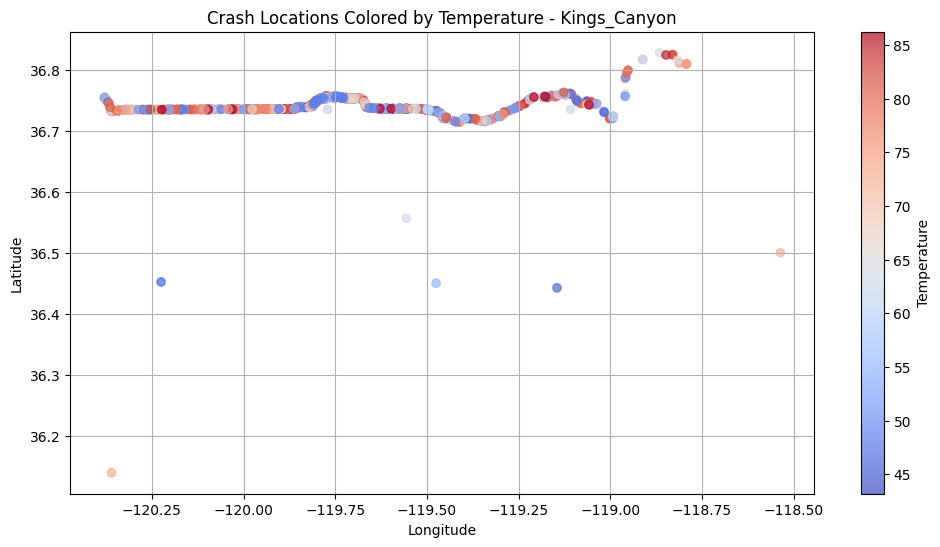

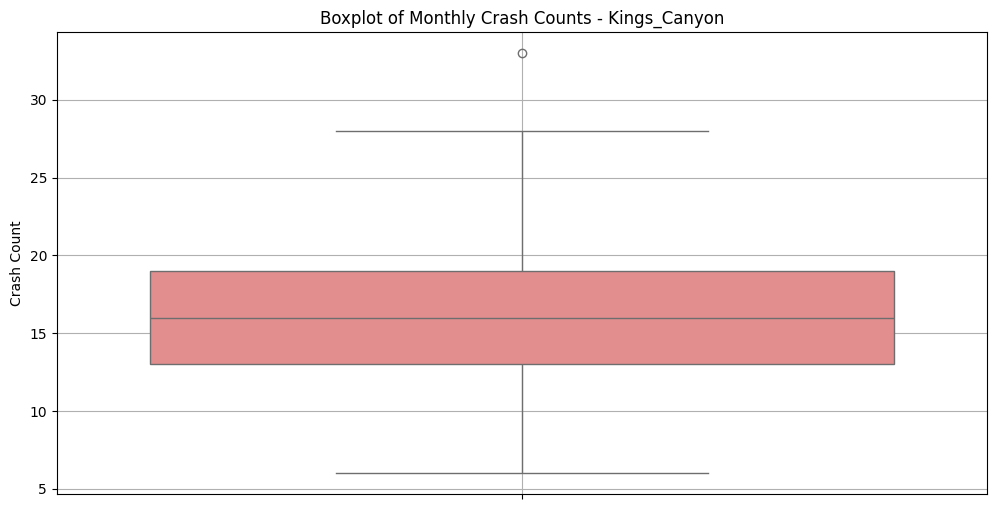


===== Processing Lassen_Volcanic =====


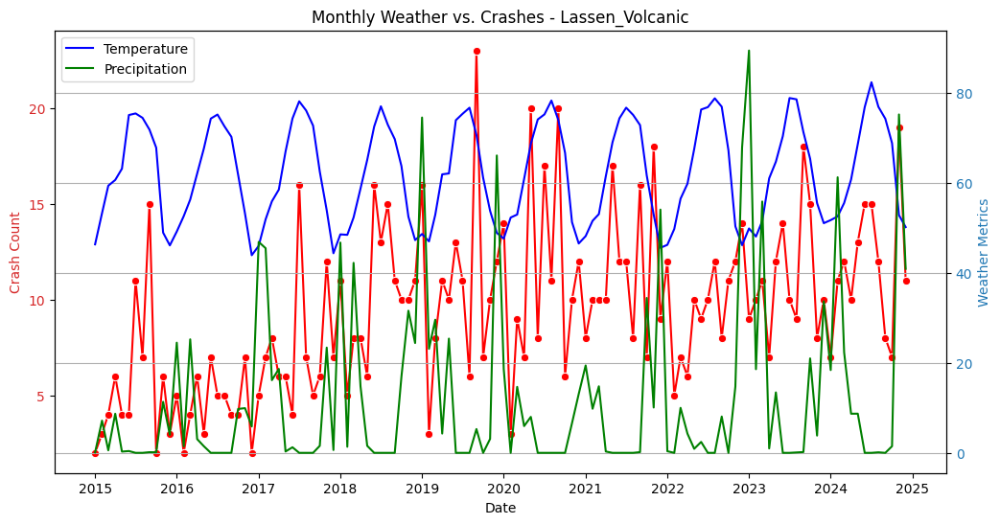

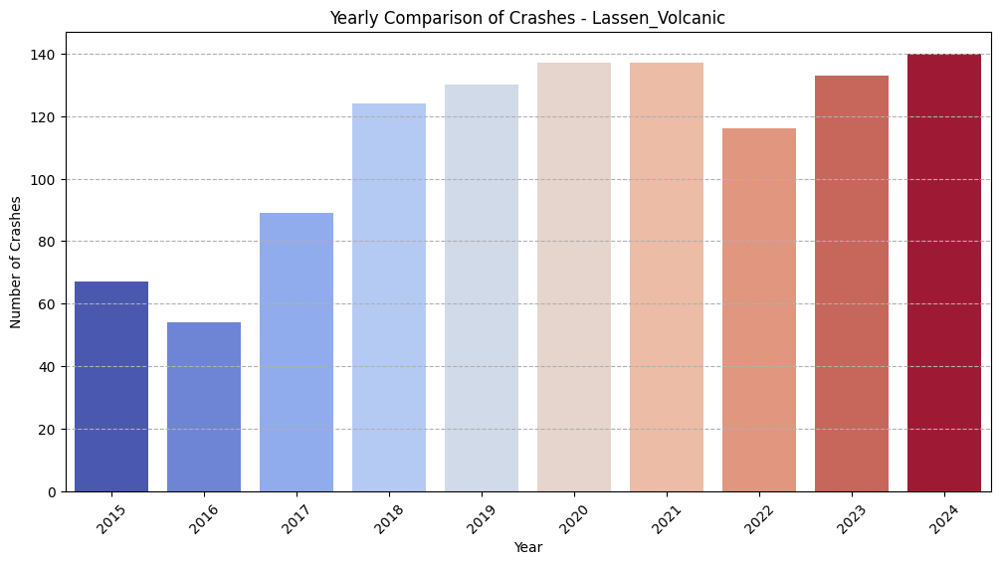

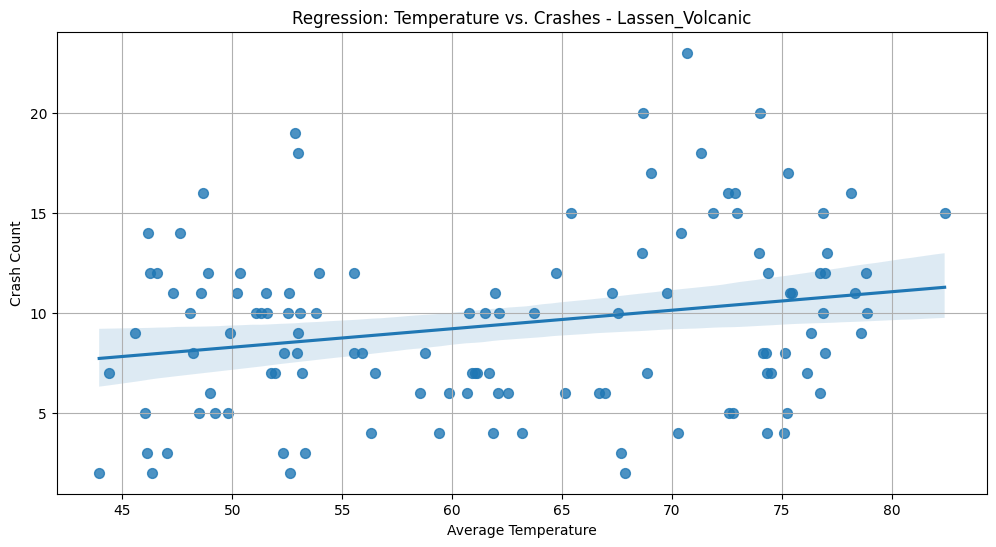

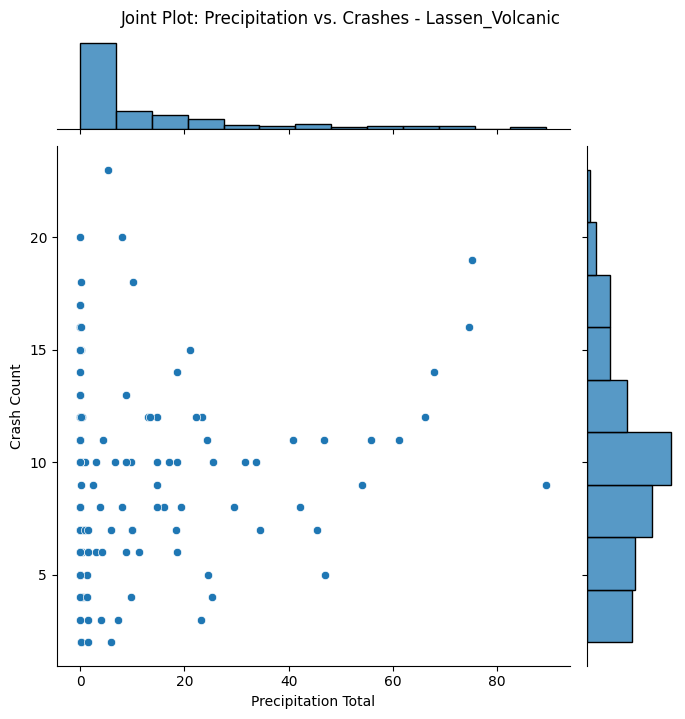

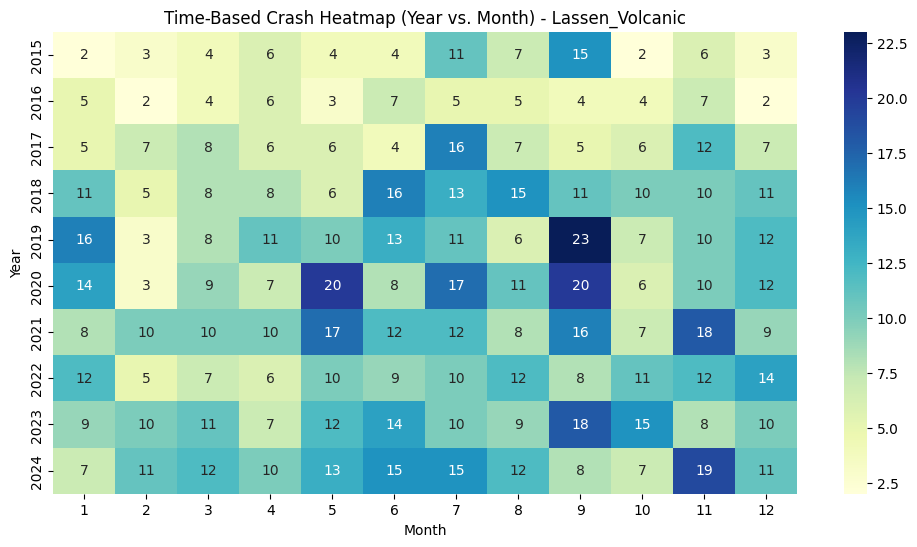

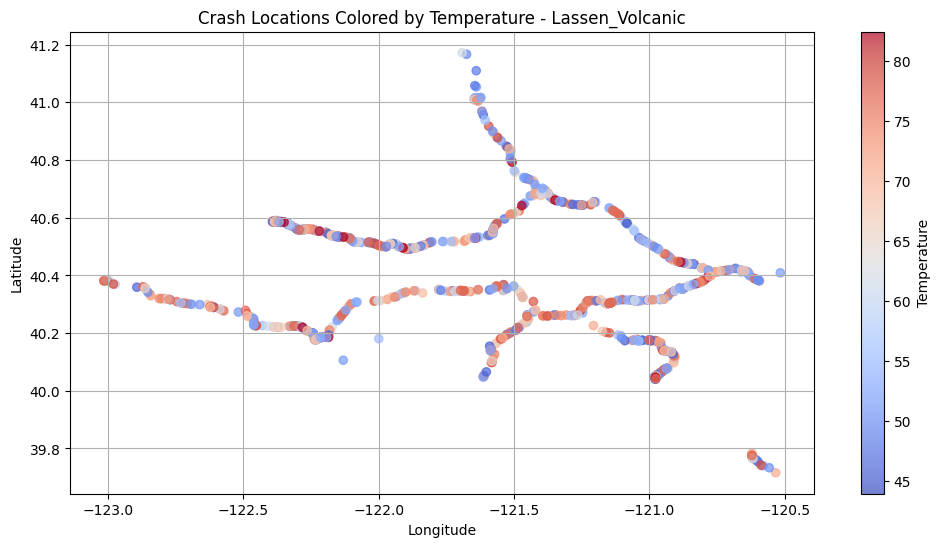

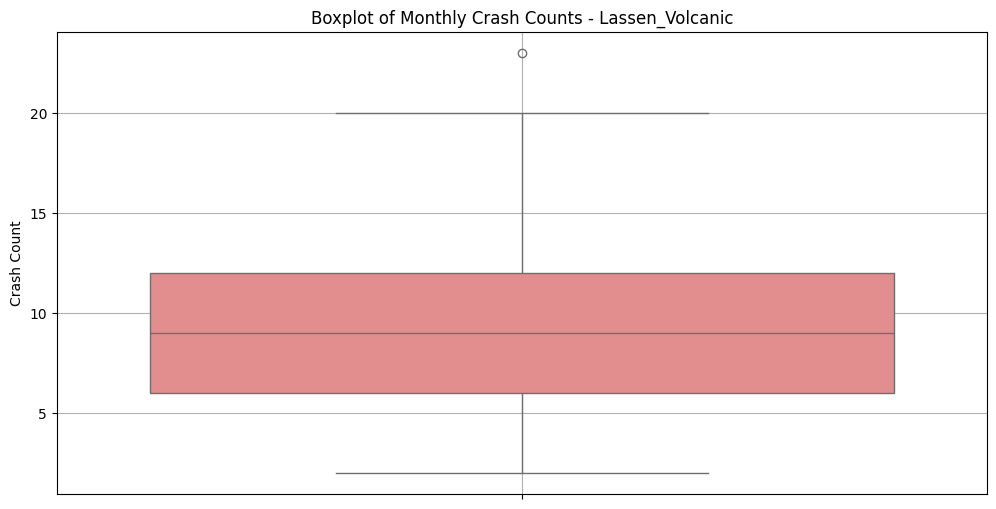


===== Processing Pinnacles =====


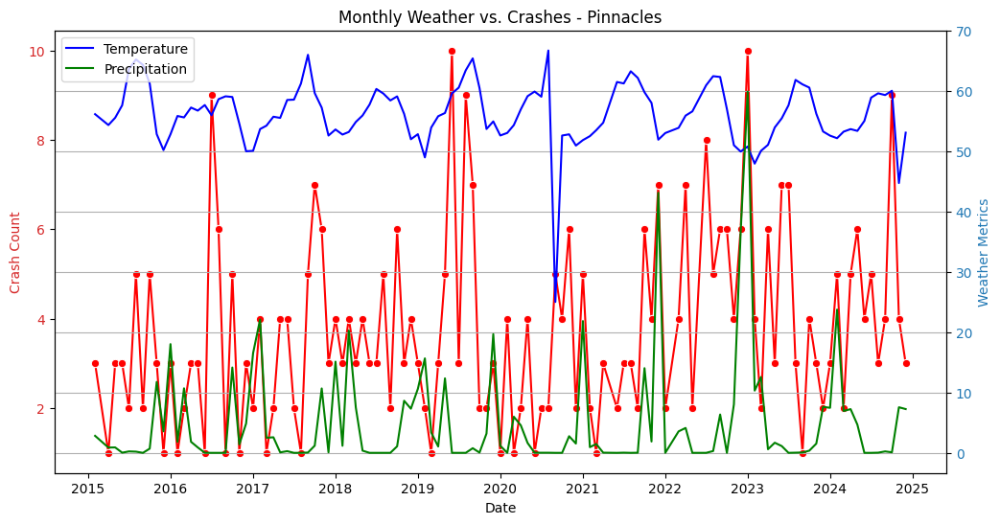

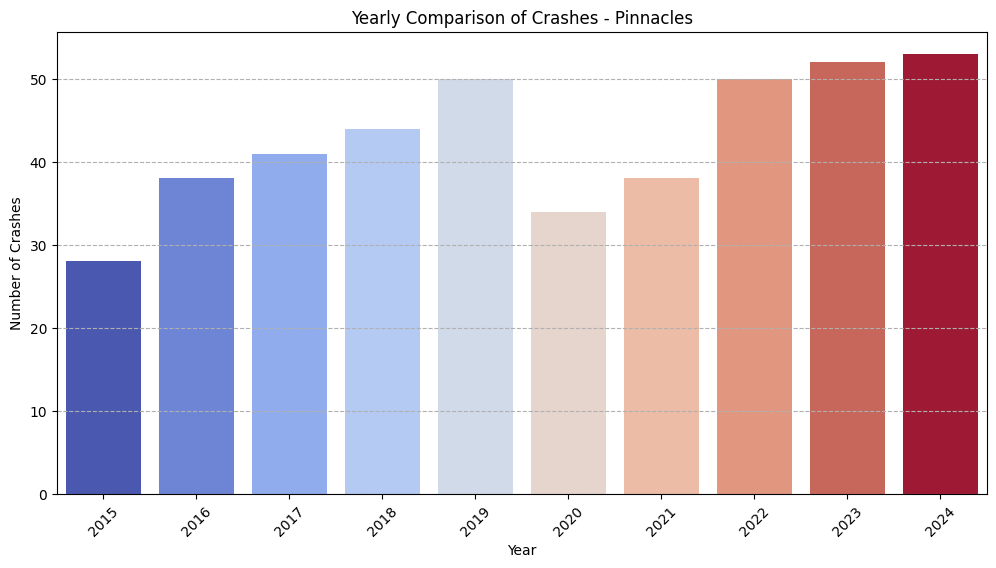

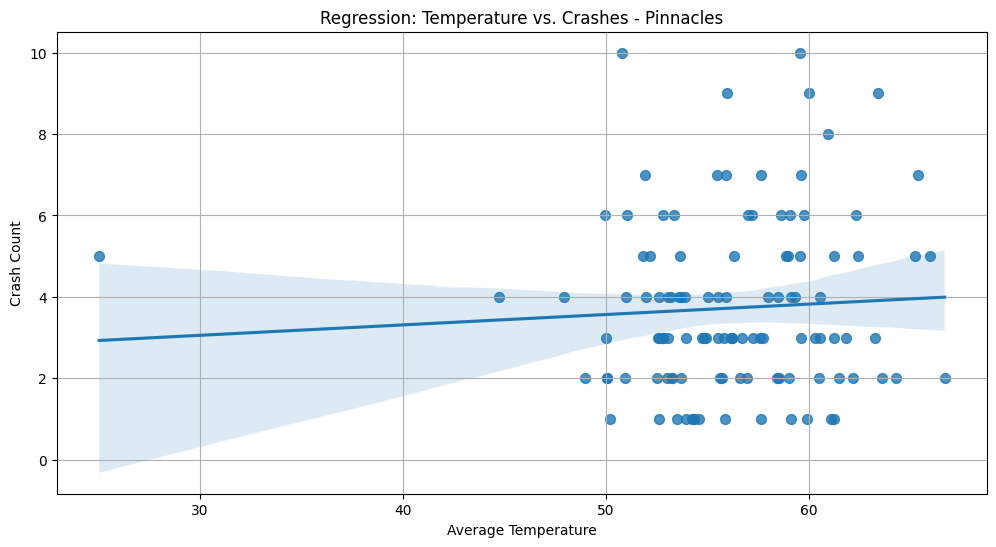

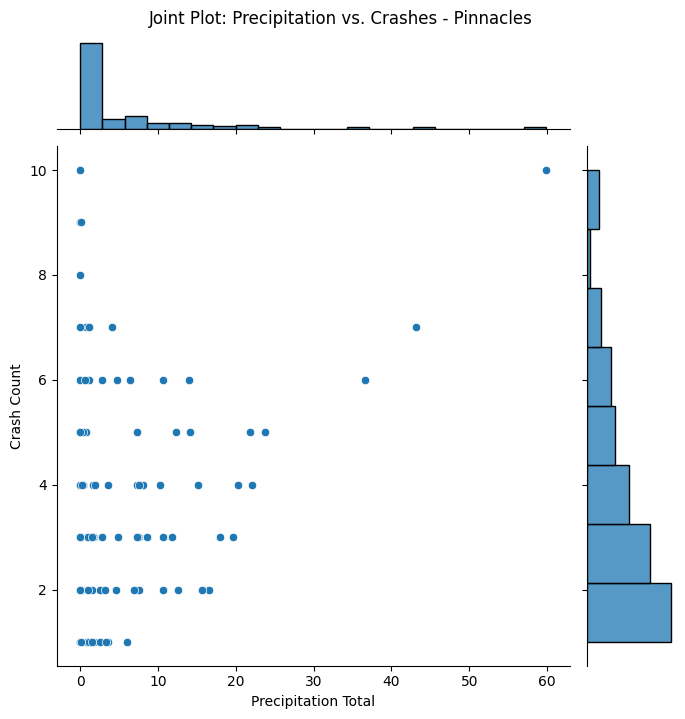

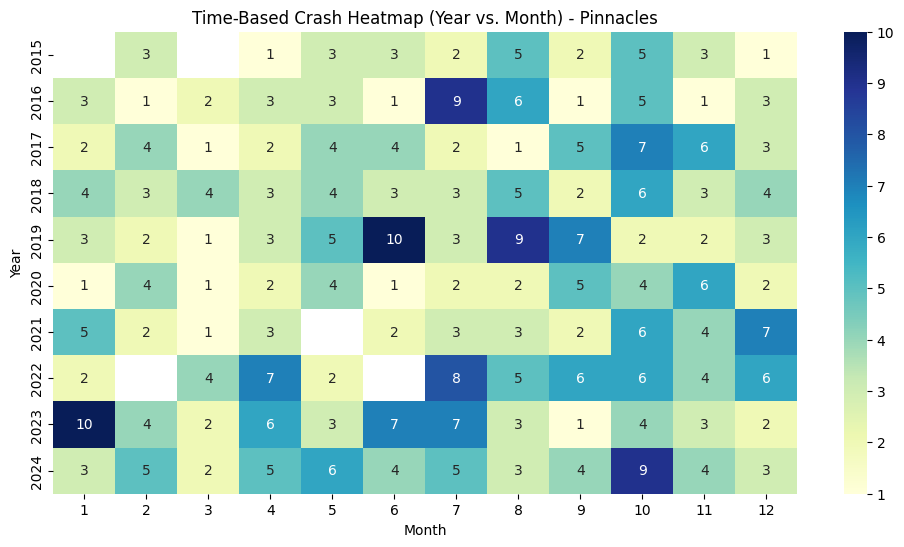

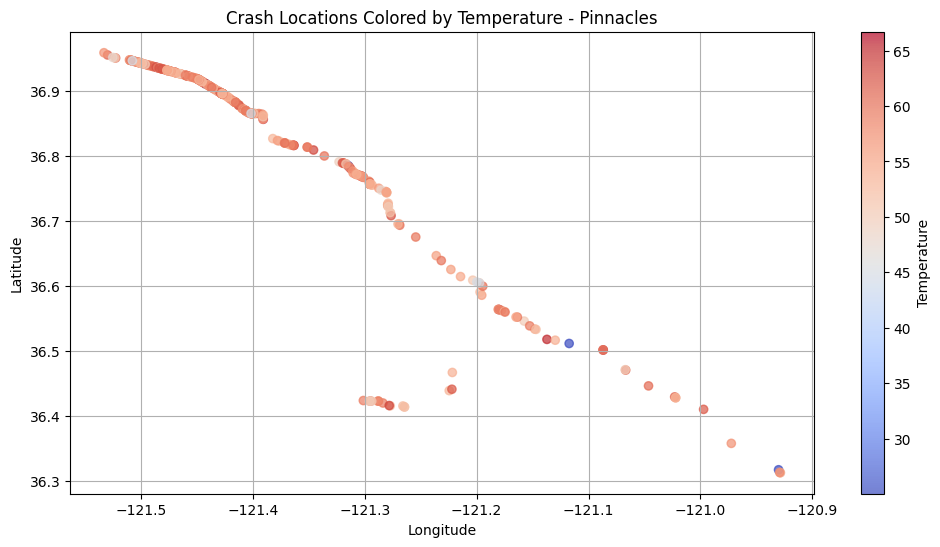

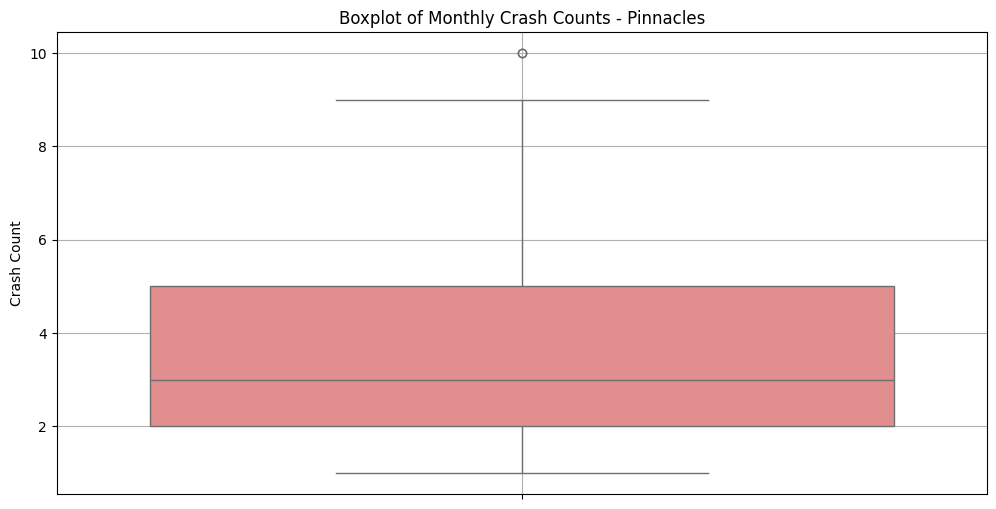


===== Processing Redwood =====


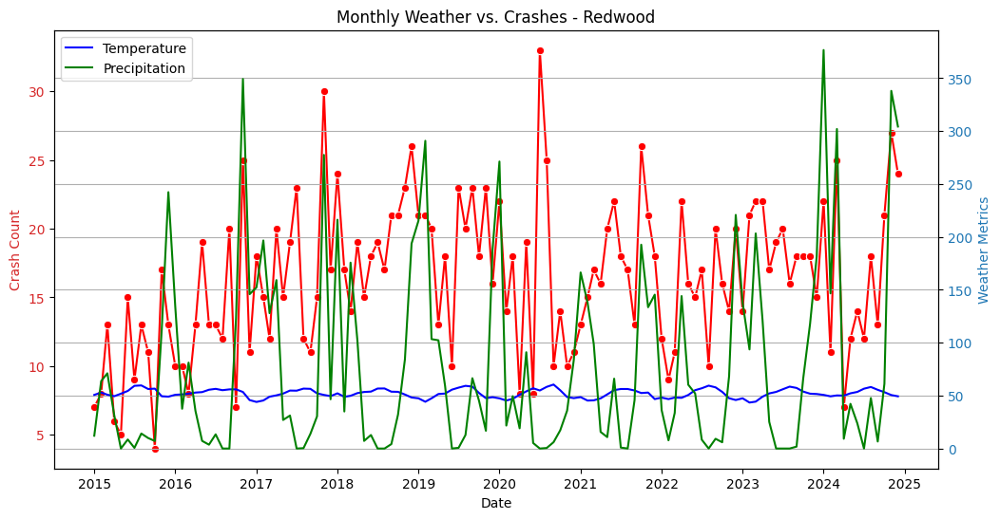

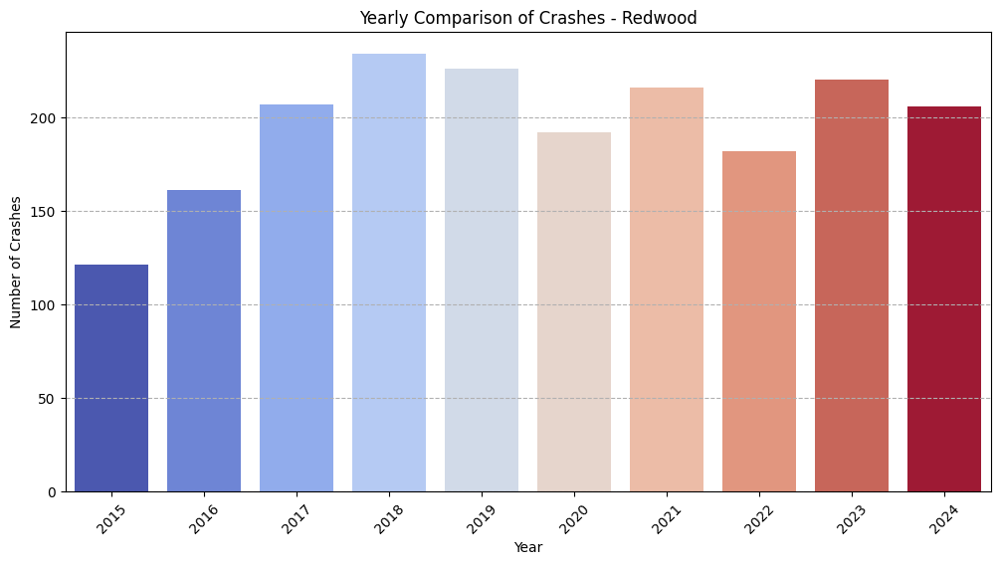

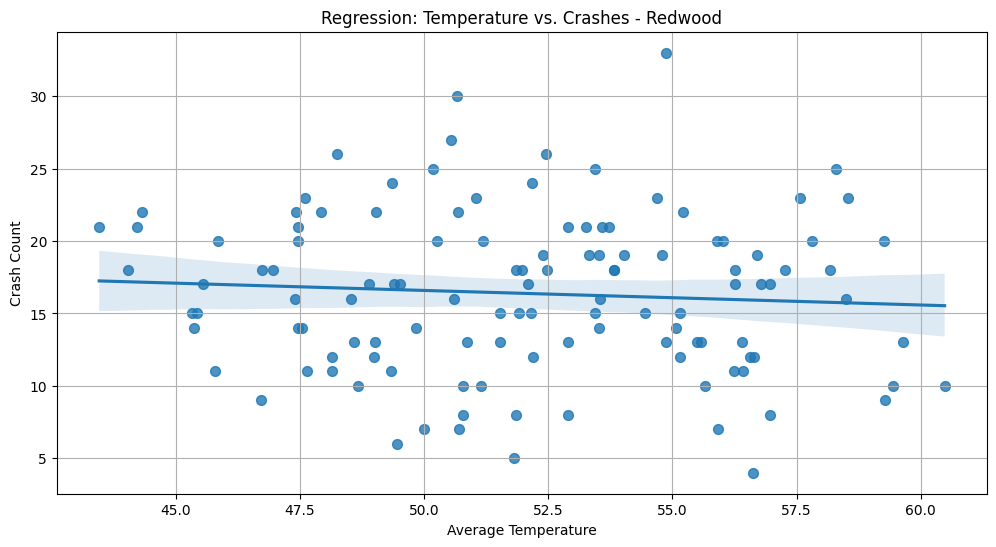

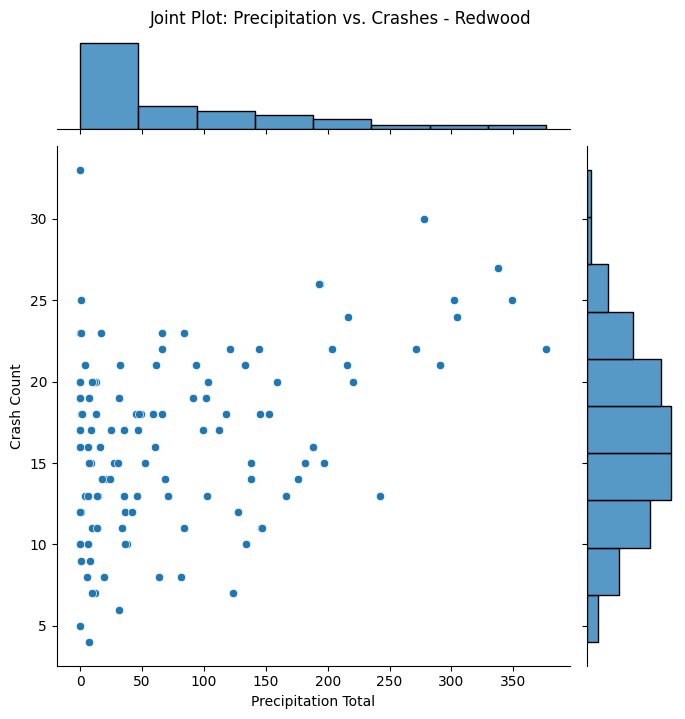

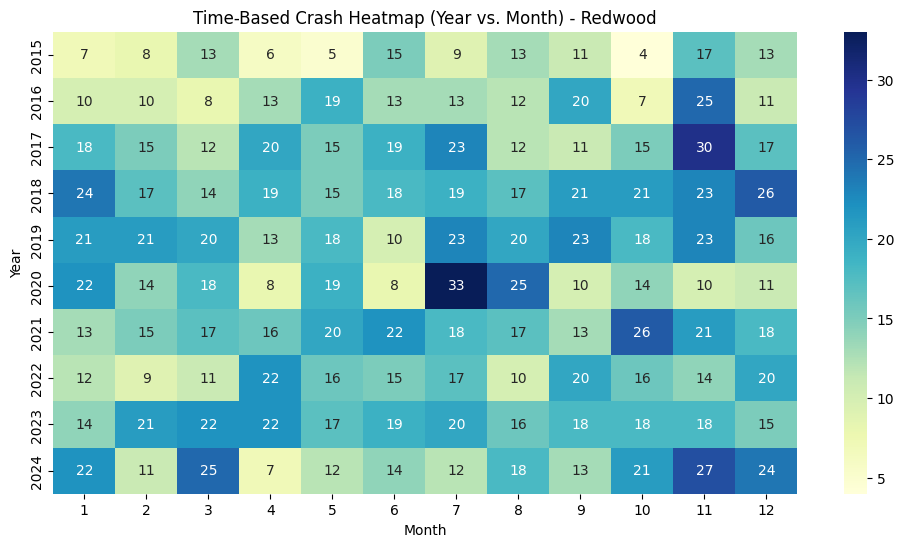

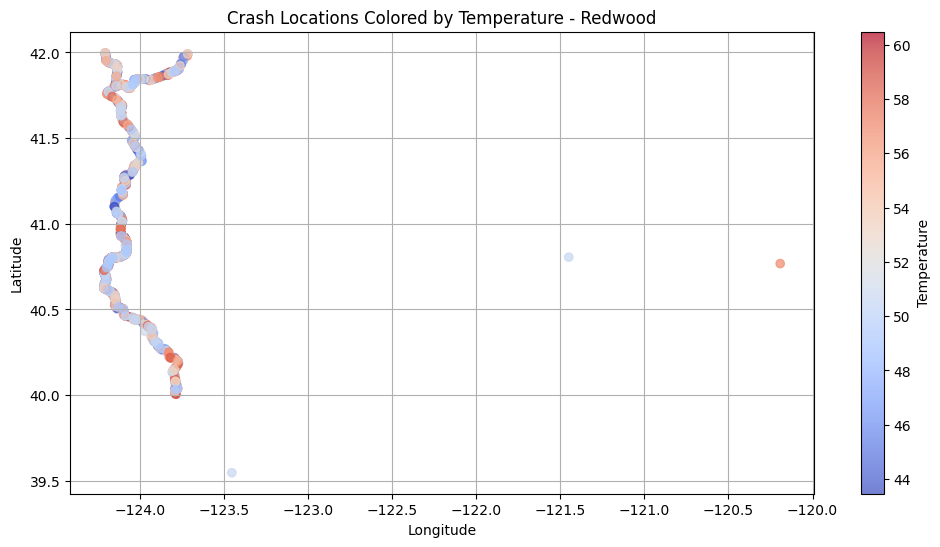

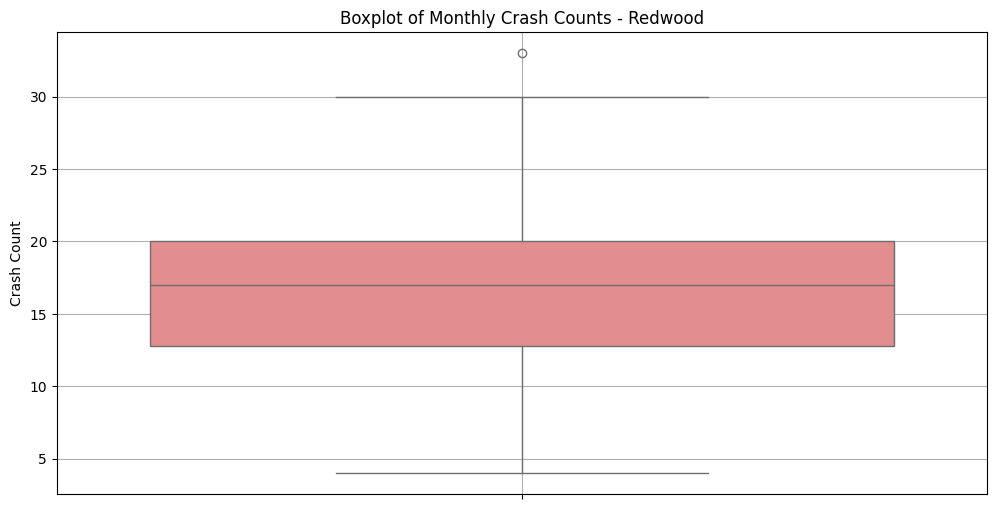


===== Processing Sequoia =====


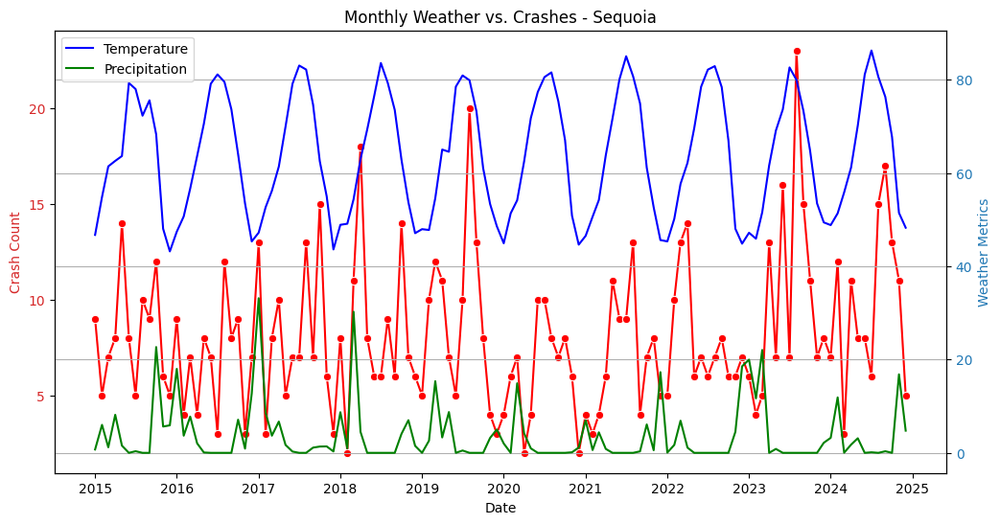

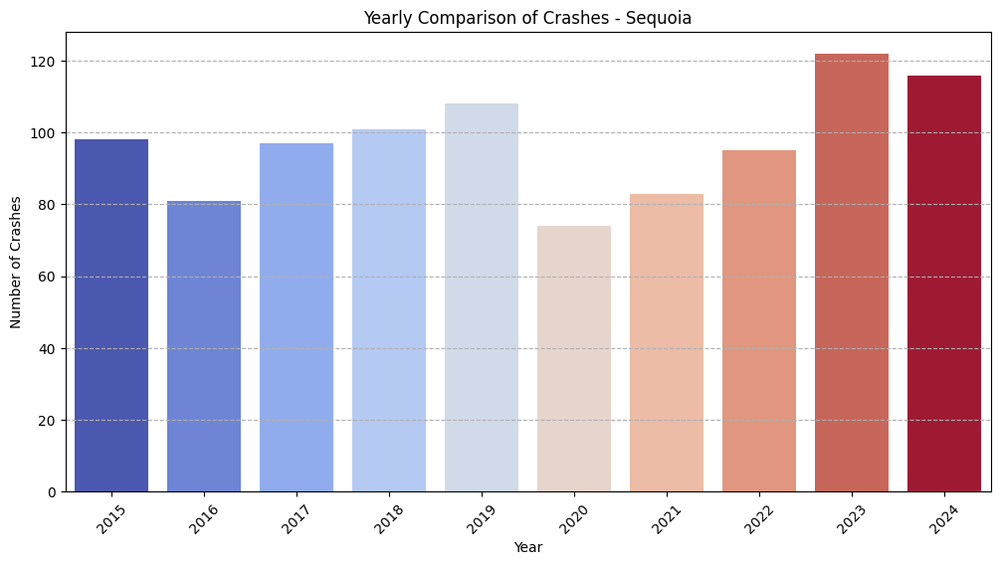

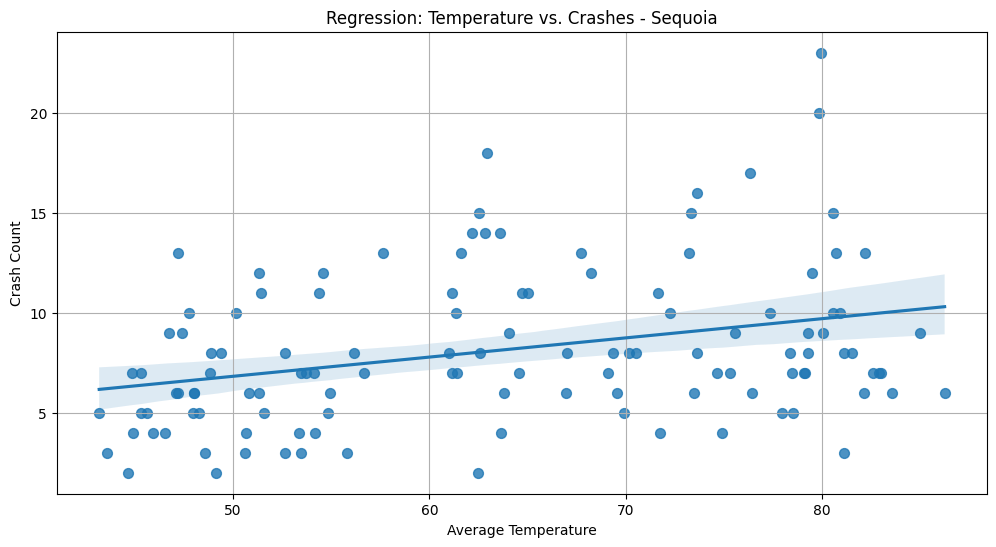

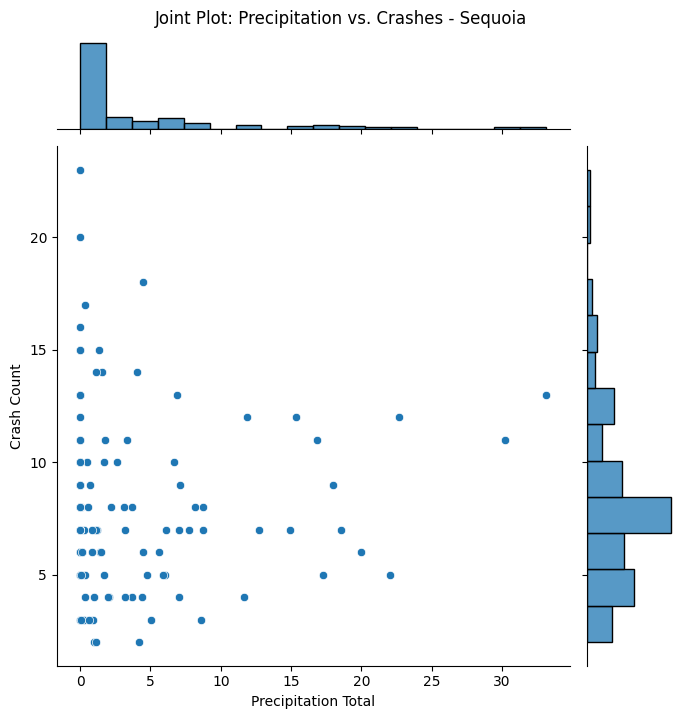

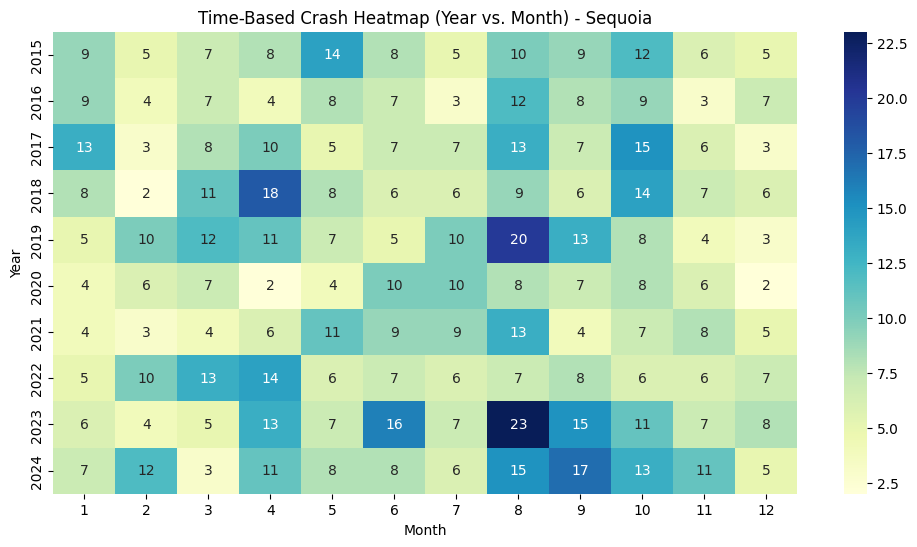

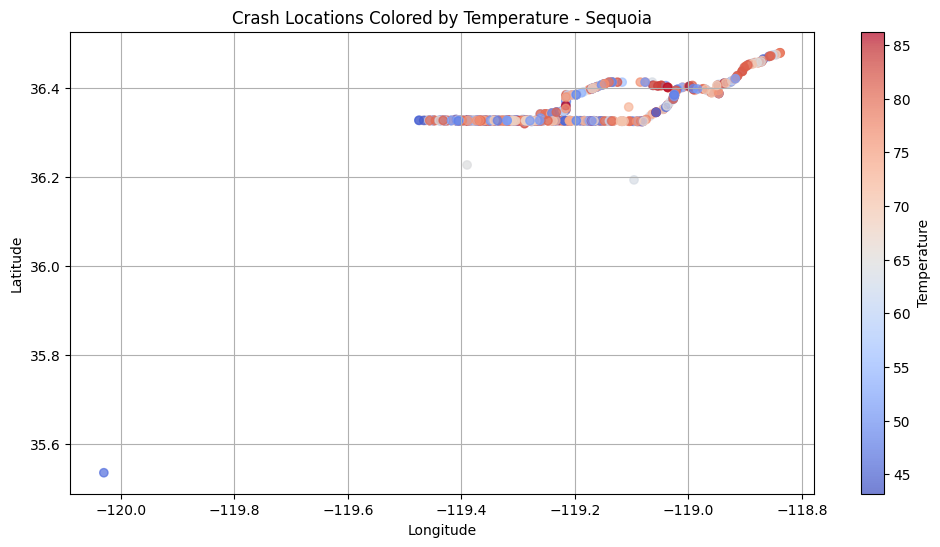

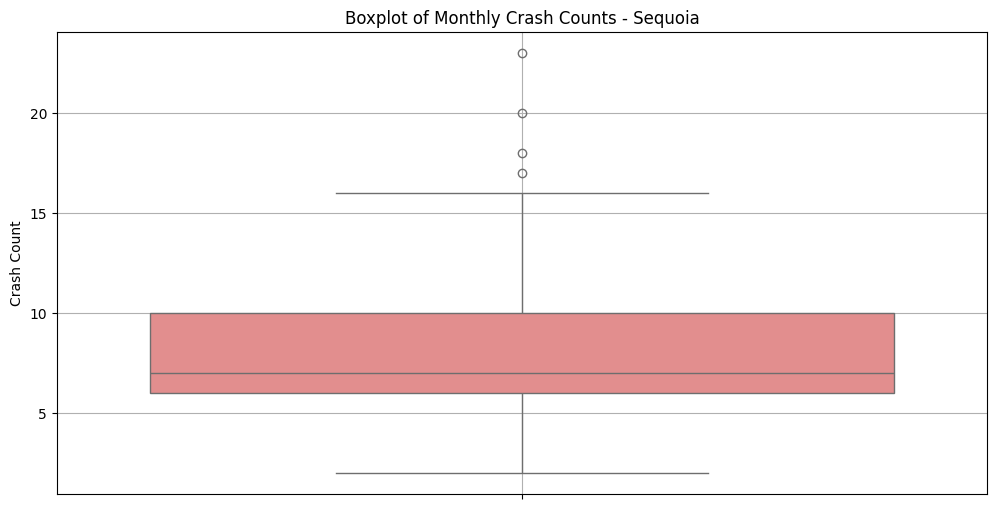


===== Processing Yosemite =====


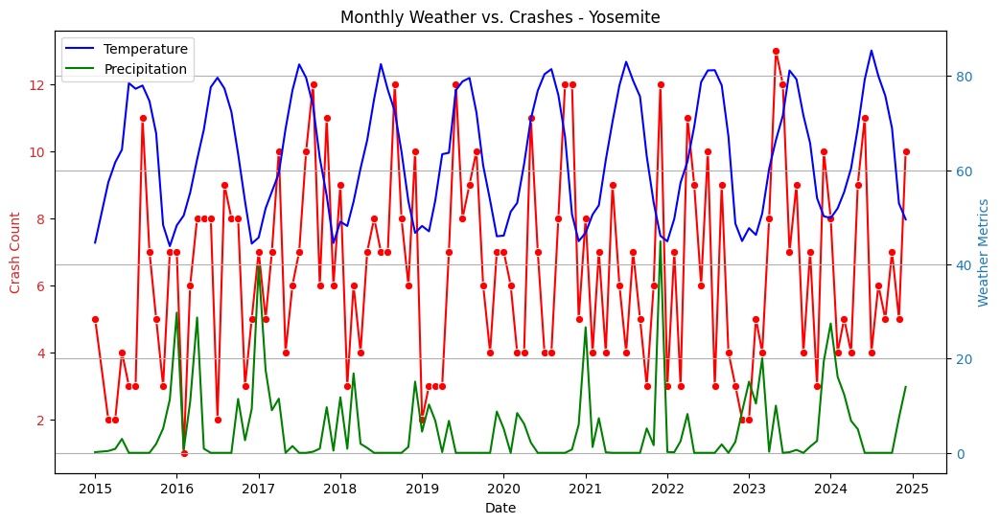

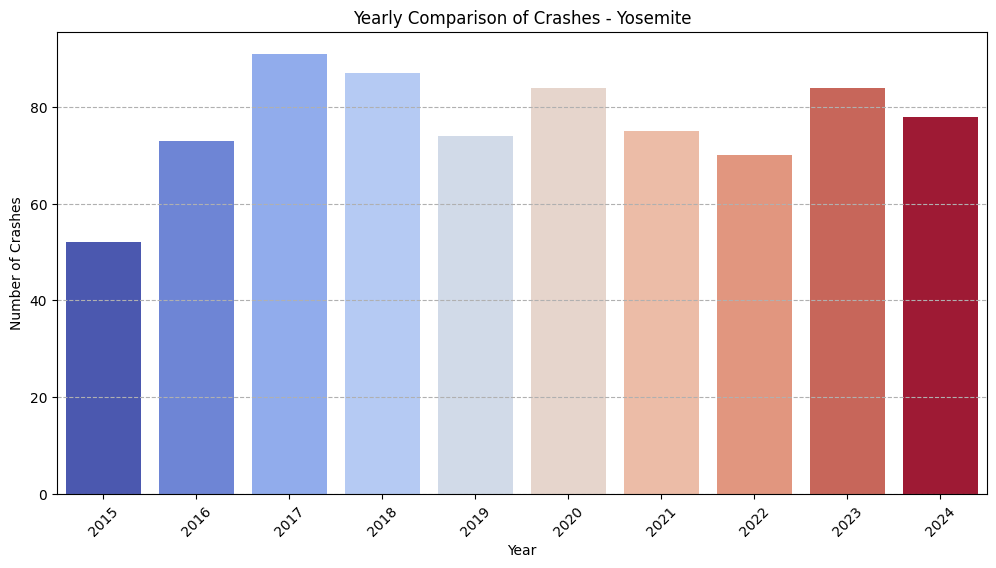

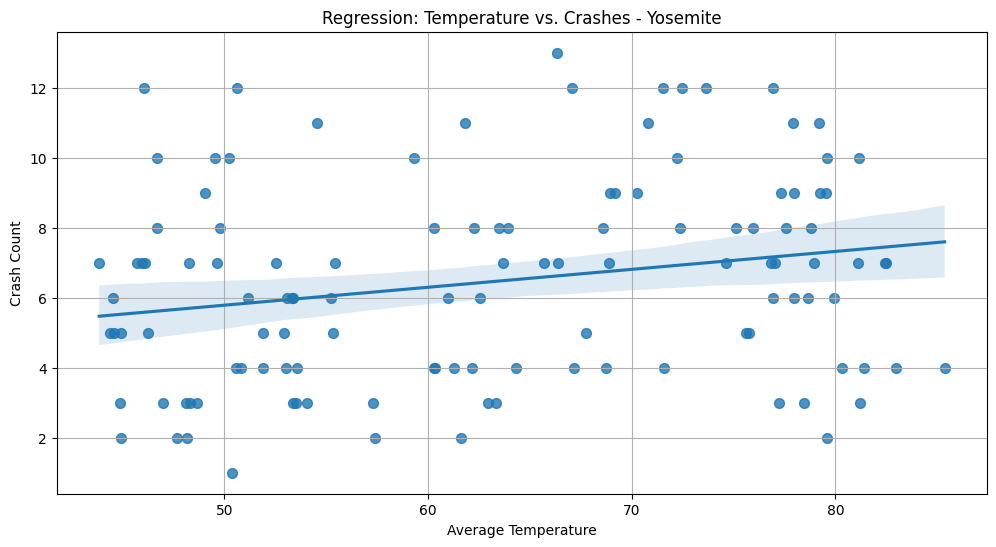

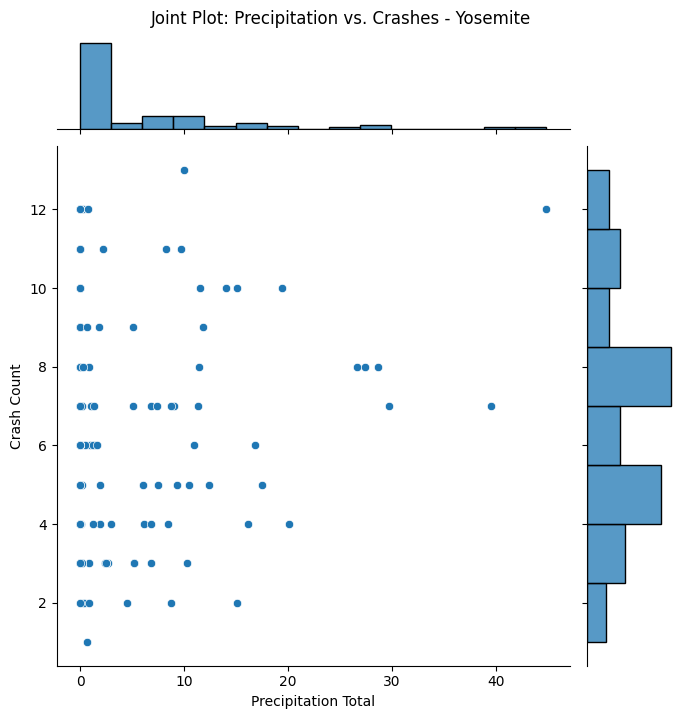

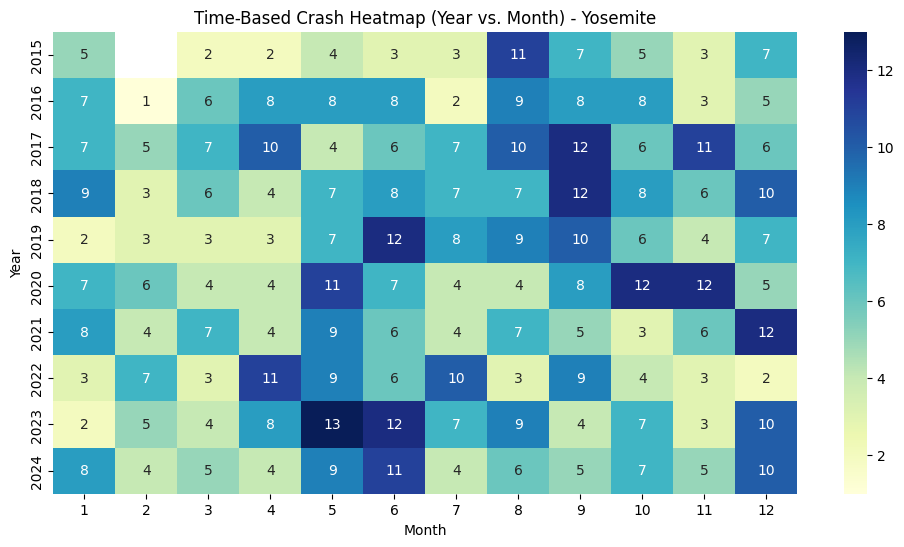

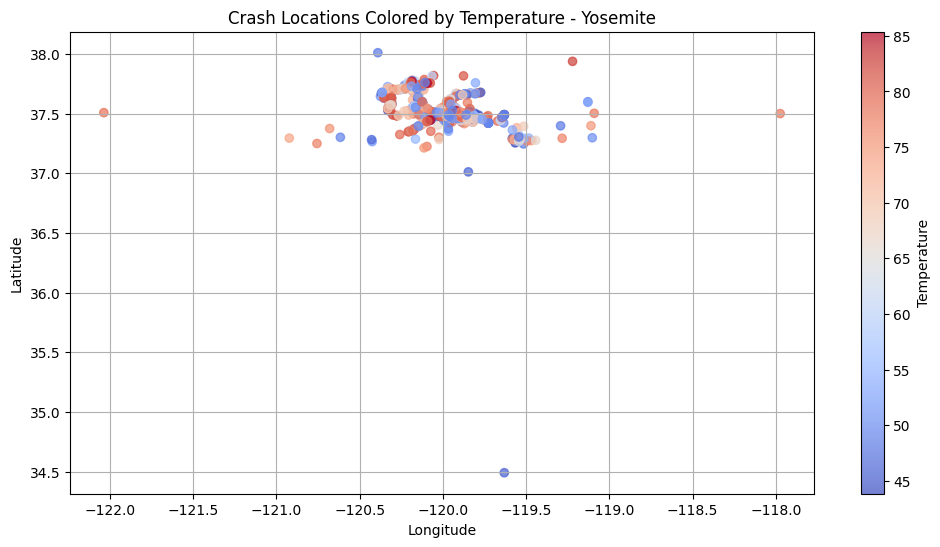

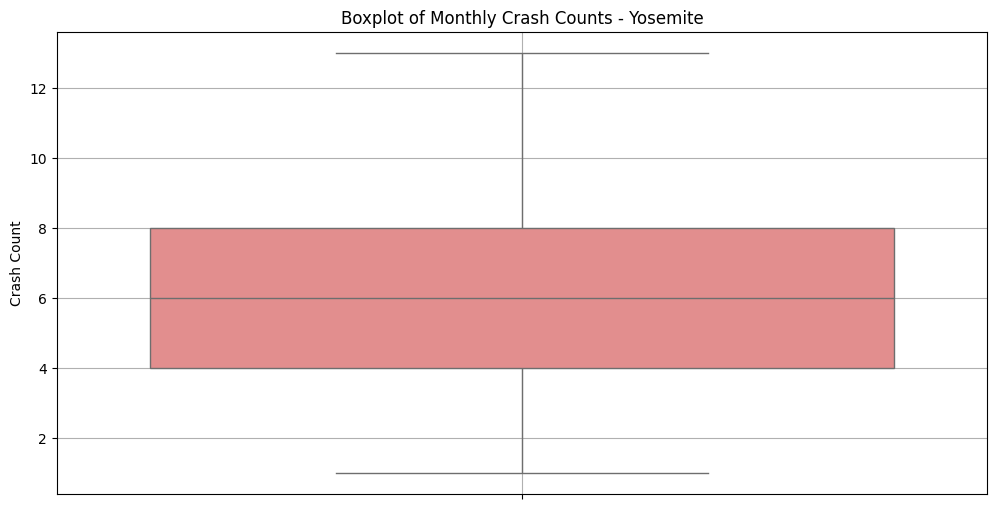


All visualizations generated.


In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Increase default figure size for better readability
plt.rcParams["figure.figsize"] = (12, 6)

# Load datasets
crashes_data = pd.read_csv('/Users/himanshunimonkar/Downloads/STA_220/crash-data/combined_national_parks_crashes.csv')
weather_data = pd.read_csv('/Users/himanshunimonkar/Downloads/STA_220/combined_monthly_totals_sorted.csv')

# Create a Date column for crashes and weather data for merging and time series plots
crashes_data['Date'] = pd.to_datetime(crashes_data['ACCIDENT_YEAR'].astype(str) + '-' + crashes_data['MONTH'].astype(str))
weather_data['Date'] = pd.to_datetime(weather_data['Year'].astype(str) + '-' + weather_data['Month'].astype(str))

# List of parks to analyze (exclude Channel_Islands since crash data isn't available)
national_parks = ["Death_Valley", "Joshua_Tree", "Kings_Canyon", 
                  "Lassen_Volcanic", "Pinnacles", "Redwood", "Sequoia", "Yosemite"]

for park in national_parks:
    print(f"\n===== Processing {park} =====")
    
    # Filter data for the current park
    park_crashes = crashes_data[crashes_data['NATIONAL_PARK'] == park].copy()
    park_weather = weather_data[weather_data['National Park'] == park].copy()
    
    if park_crashes.empty or park_weather.empty:
        print(f"Data missing for {park}, skipping...")
        continue

    # ----------------------------------------
    # 1. Time Series Visualizations
    # ----------------------------------------
    # (A) Merge park data on Year and Month (weather data already has Date)
    merged_data = pd.merge(
        park_crashes, park_weather, 
        left_on=['ACCIDENT_YEAR', 'MONTH'], 
        right_on=['Year', 'Month'],
        how='inner',
        suffixes=('_crash', '_weather')
    )
    
    # Create monthly aggregated data from merged_data
    monthly_aggregated = merged_data.groupby(['ACCIDENT_YEAR', 'MONTH']).agg({
        'Temp Avg': 'mean',
        'Precipitation Total': 'sum',
        'Wind Speed Avg': 'mean',
        'Pressure Avg': 'mean'
    }).reset_index()
    # Add crash count per month
    monthly_aggregated['Crash Count'] = merged_data.groupby(['ACCIDENT_YEAR', 'MONTH']).size().values
    monthly_aggregated['Date'] = pd.to_datetime(monthly_aggregated['ACCIDENT_YEAR'].astype(str) + '-' + monthly_aggregated['MONTH'].astype(str))
    
    # (B) Dual Axis Time Series: Monthly Weather vs. Crashes
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Crash Count', color='tab:red')
    sns.lineplot(data=monthly_aggregated, x='Date', y='Crash Count', marker='o', ax=ax1, color='red')
    ax1.tick_params(axis='y', labelcolor='tab:red')
    
    ax2 = ax1.twinx()
    ax2.set_ylabel('Weather Metrics', color='tab:blue')
    sns.lineplot(data=monthly_aggregated, x='Date', y='Temp Avg', ax=ax2, label="Temperature", color='blue')
    sns.lineplot(data=monthly_aggregated, x='Date', y='Precipitation Total', ax=ax2, label="Precipitation", color='green')
    ax2.tick_params(axis='y', labelcolor='tab:blue')
    
    plt.title(f"Monthly Weather vs. Crashes - {park}")
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()
    
    # (C) Yearly Comparison of Crashes
    yearly_crashes = park_crashes.groupby('ACCIDENT_YEAR').size().reset_index(name='Crash Count')
    plt.figure()
    sns.barplot(data=yearly_crashes, x='ACCIDENT_YEAR', y='Crash Count', 
            hue='ACCIDENT_YEAR', palette='coolwarm', legend=False)
    plt.title(f"Yearly Comparison of Crashes - {park}")
    plt.xlabel("Year")
    plt.ylabel("Number of Crashes")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--')
    plt.show()
    
    # ----------------------------------------
    # 2. Weather Conditions vs. Crashes (Statistical Analysis)
    # ----------------------------------------
    # (A) Regression Plot: Temperature vs. Crashes
    plt.figure()
    sns.regplot(data=monthly_aggregated, x='Temp Avg', y='Crash Count', scatter_kws={'s':50})
    plt.title(f"Regression: Temperature vs. Crashes - {park}")
    plt.xlabel("Average Temperature")
    plt.ylabel("Crash Count")
    plt.grid(True)
    plt.show()
    
    # (B) Joint Plot: Precipitation vs. Crashes
    sns.jointplot(data=monthly_aggregated, x='Precipitation Total', y='Crash Count', kind='scatter', height=7)
    plt.suptitle(f"Joint Plot: Precipitation vs. Crashes - {park}", y=1.02)
    plt.show()
    
    # ----------------------------------------
    # 3. Heatmap: Time-Based Crash Trends
    # ----------------------------------------
    time_pivot = monthly_aggregated.pivot(index='ACCIDENT_YEAR', columns='MONTH', values='Crash Count')
    plt.figure()
    sns.heatmap(time_pivot, annot=True, cmap='YlGnBu', fmt=".0f")
    plt.title(f"Time-Based Crash Heatmap (Year vs. Month) - {park}")
    plt.xlabel("Month")
    plt.ylabel("Year")
    plt.show()
    
    # ----------------------------------------
    # 4. Geographical Analysis
    # ----------------------------------------
    geo_data = pd.merge(
        park_crashes, park_weather, 
        left_on=['ACCIDENT_YEAR', 'MONTH'], 
        right_on=['Year', 'Month'], 
        how='left'
    )
    plt.figure()
    scatter = plt.scatter(geo_data['LONGITUDE'], geo_data['LATITUDE'], 
                          c=geo_data['Temp Avg'], cmap='coolwarm', alpha=0.7)
    plt.colorbar(scatter, label='Temperature')
    plt.title(f"Crash Locations Colored by Temperature - {park}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True)
    plt.show()
    
    # ----------------------------------------
    # 5. Distribution Analysis: Boxplot for Crash Counts
    # ----------------------------------------
    plt.figure()
    sns.boxplot(y=monthly_aggregated['Crash Count'], color='lightcoral')
    plt.title(f"Boxplot of Monthly Crash Counts - {park}")
    plt.ylabel("Crash Count")
    plt.grid(True)
    plt.show()
    
print("\nAll visualizations generated.")


In [25]:
import pandas as pd

# Define month mapping
month_map = {
    'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
    'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12
}

# Read the CSV file
df = pd.read_csv('/Users/himanshunimonkar/Downloads/STA_220/footfall-stats-california-national-parks.csv')

# Convert month abbreviations to numbers
df['Month'] = df['Month'].map(month_map)

# Sort the data: first by National Park, then Year, then Month
df = df.sort_values(['National Park', 'Year', 'Month'])

# Reorder columns if needed (optional)
df = df[['National Park', 'Year', 'Month', 'Footfall']]

# Save the modified DataFrame to a new CSV file
df.to_csv('/Users/himanshunimonkar/Downloads/STA_220/footfall-stats-california-national-parks_modified.csv', 
          index=False)

print("Data has been processed and saved to 'footfall-stats-california-national-parks_modified.csv'")
print("\nFirst few rows of the modified data:")
print(df.head())

Data has been processed and saved to 'footfall-stats-california-national-parks_modified.csv'

First few rows of the modified data:
      National Park  Year  Month  Footfall
11  Channel_Islands  2015      1     20377
10  Channel_Islands  2015      2     22198
9   Channel_Islands  2015      3     30723
8   Channel_Islands  2015      4     24066
7   Channel_Islands  2015      5     35720



Generating visualizations for: Death_Valley


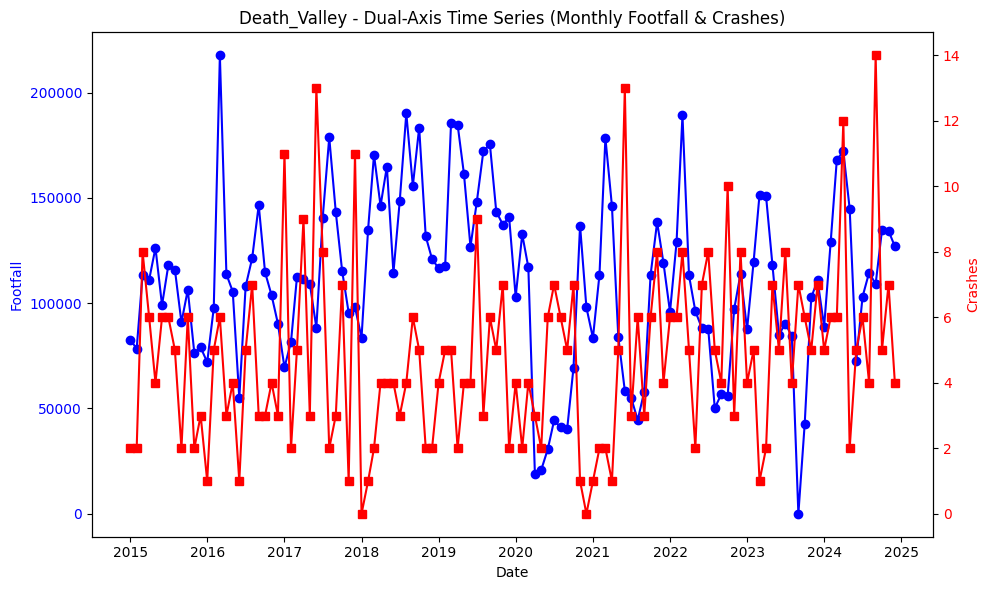

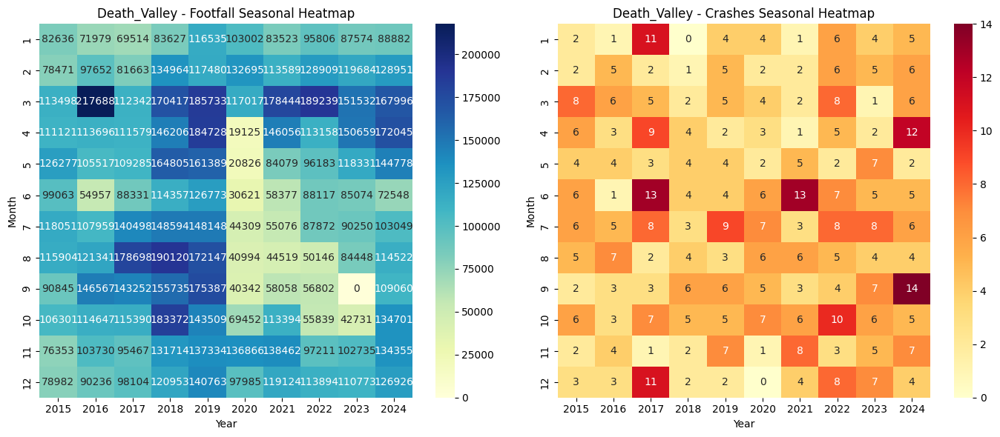

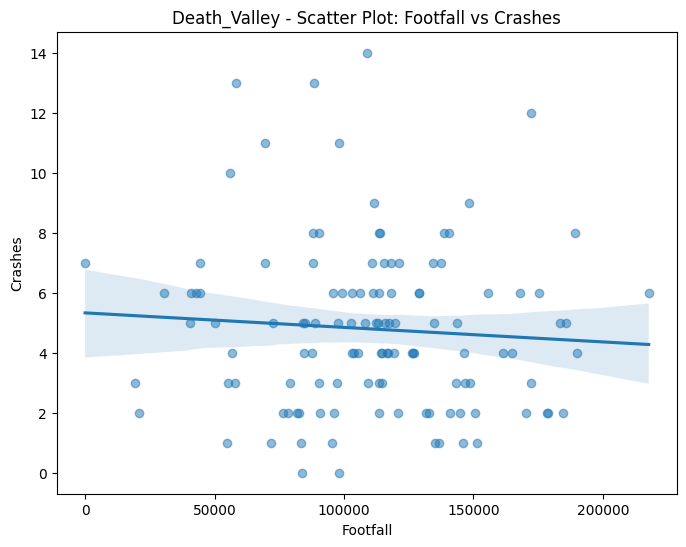

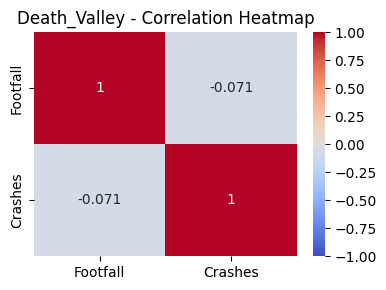

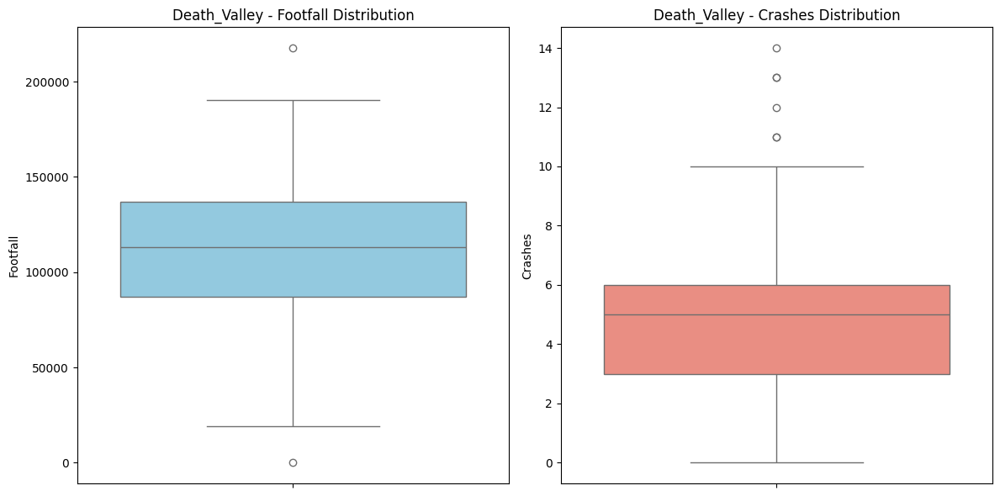

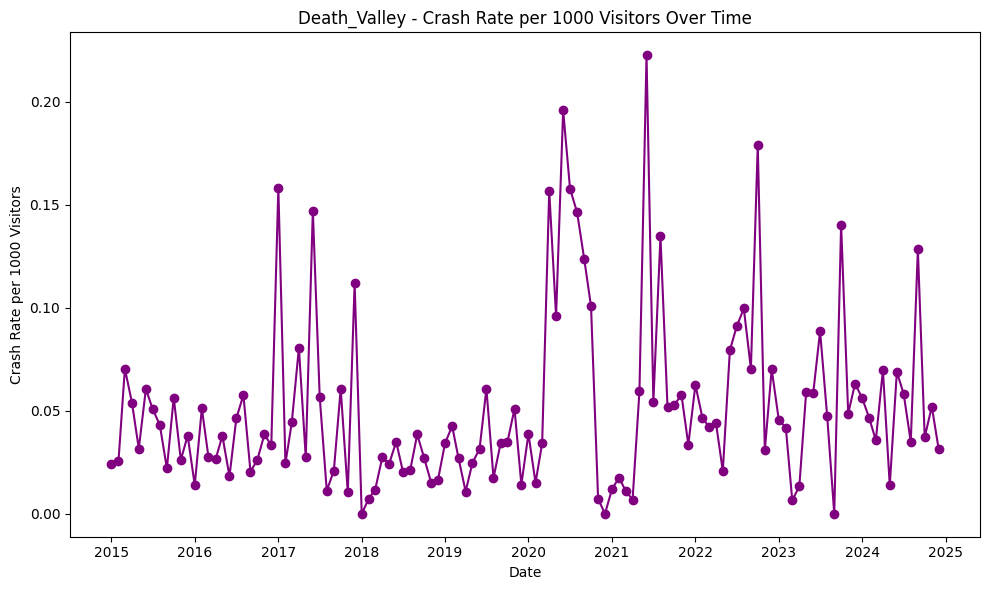


Generating visualizations for: Joshua_Tree


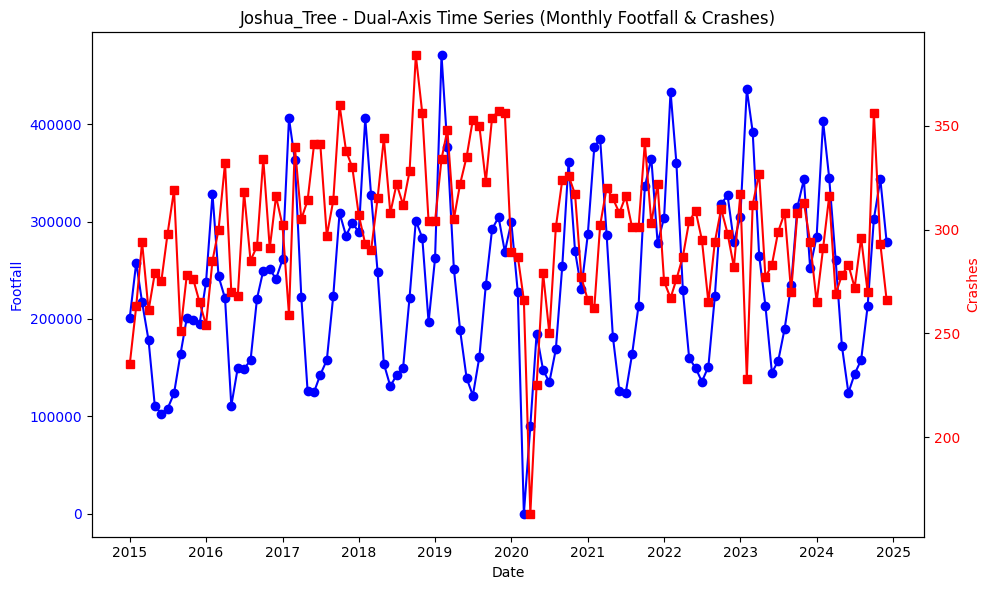

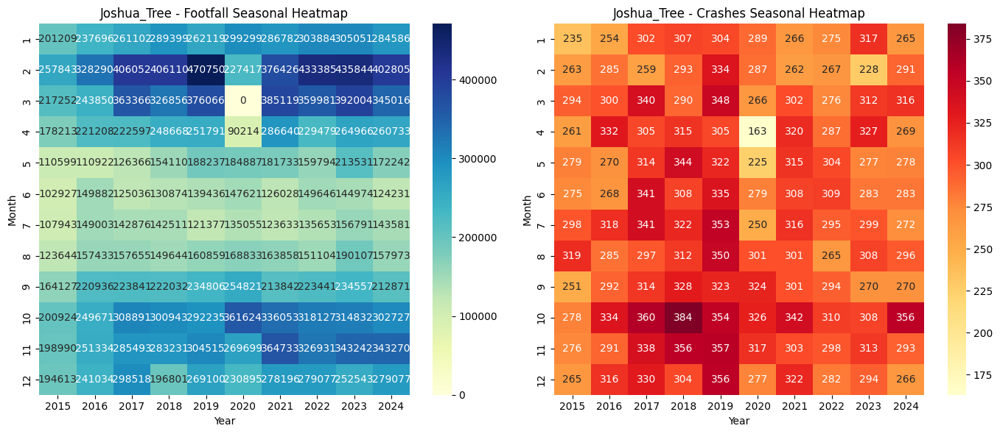

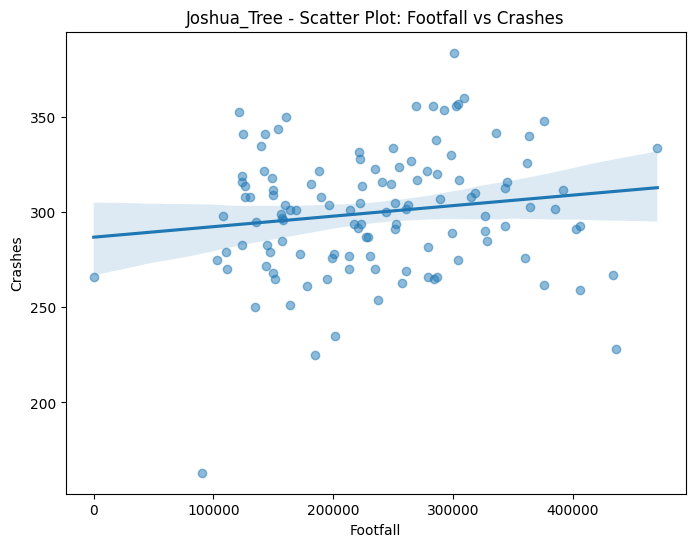

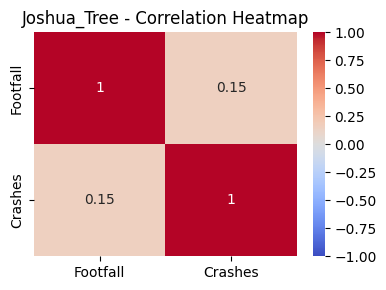

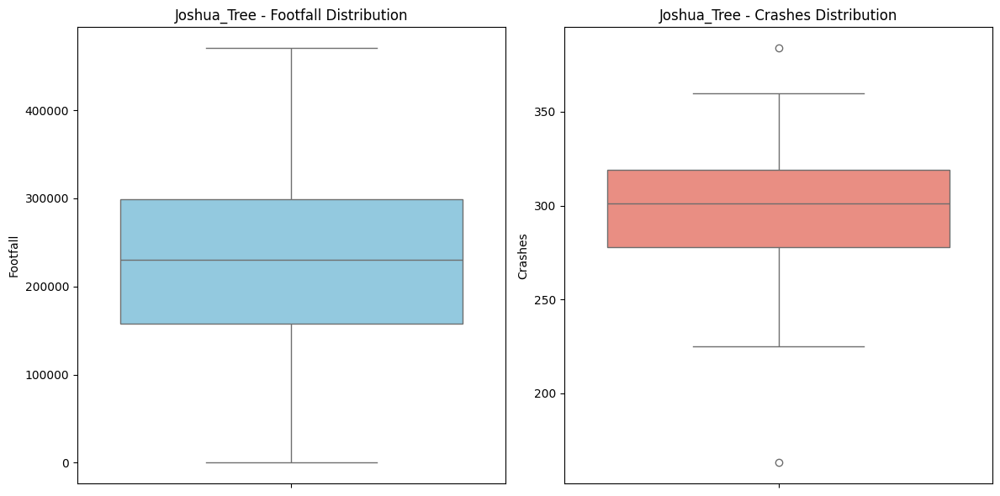

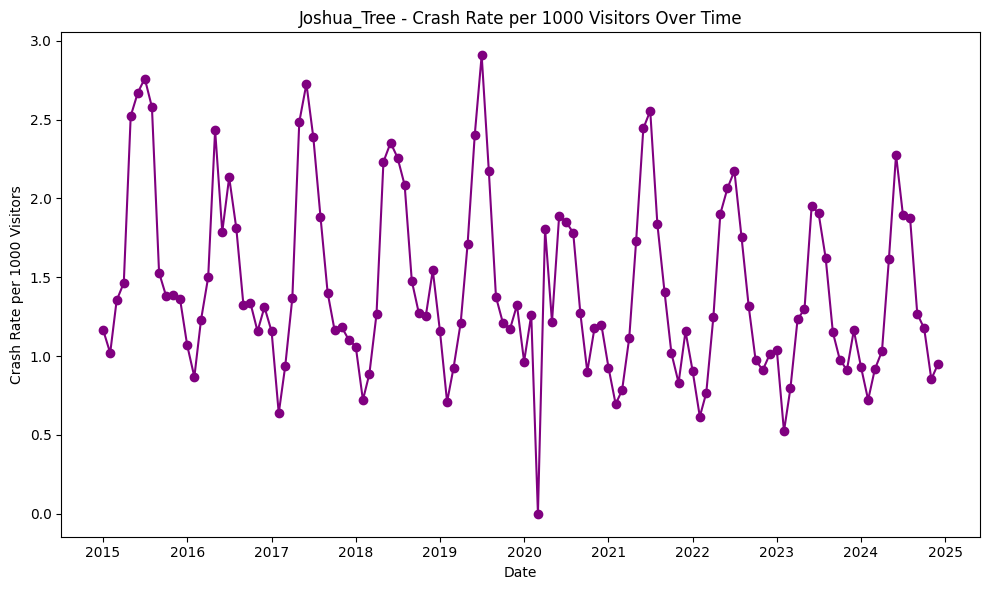


Generating visualizations for: Kings_Canyon


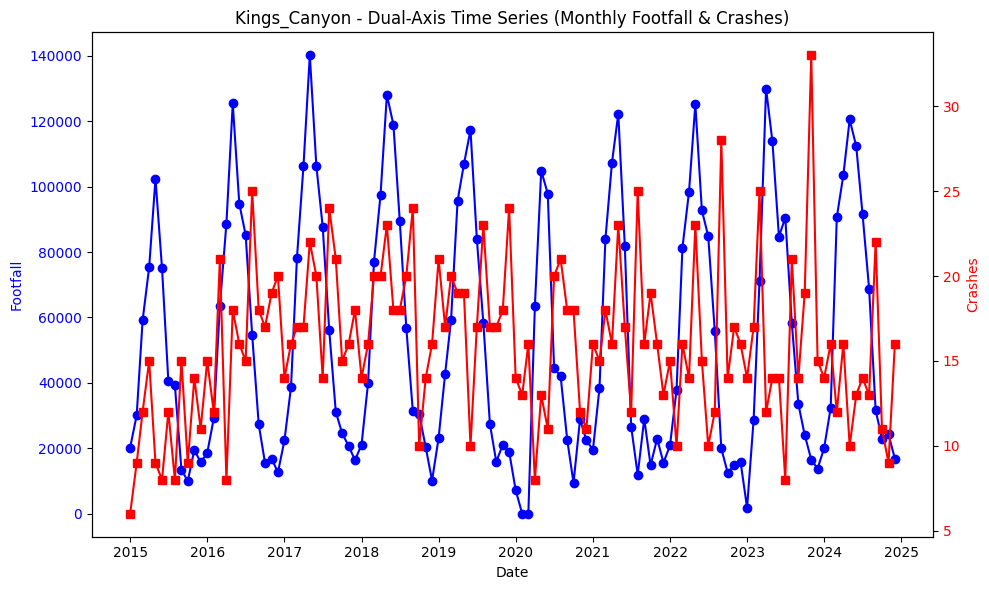

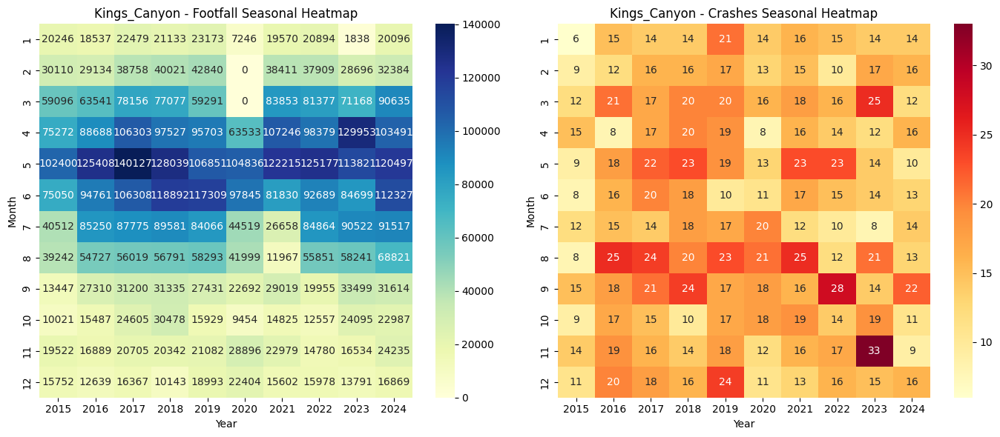

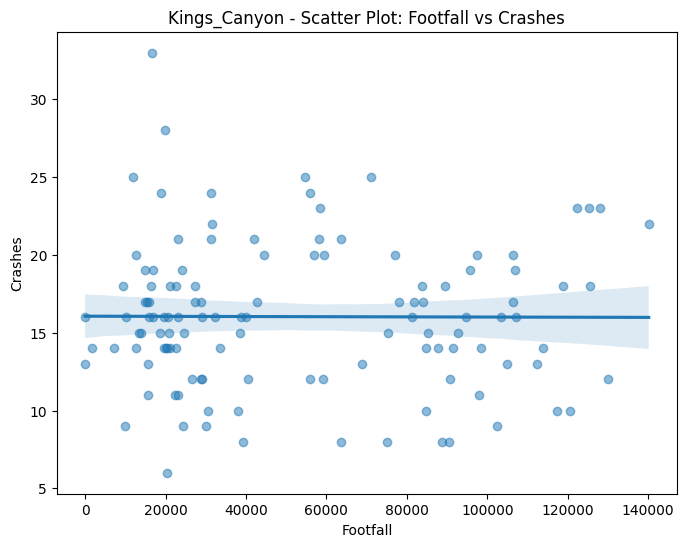

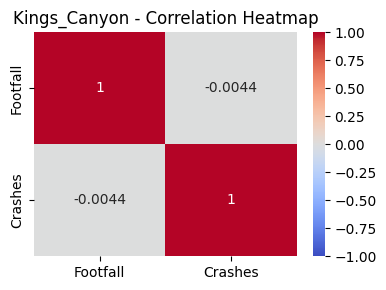

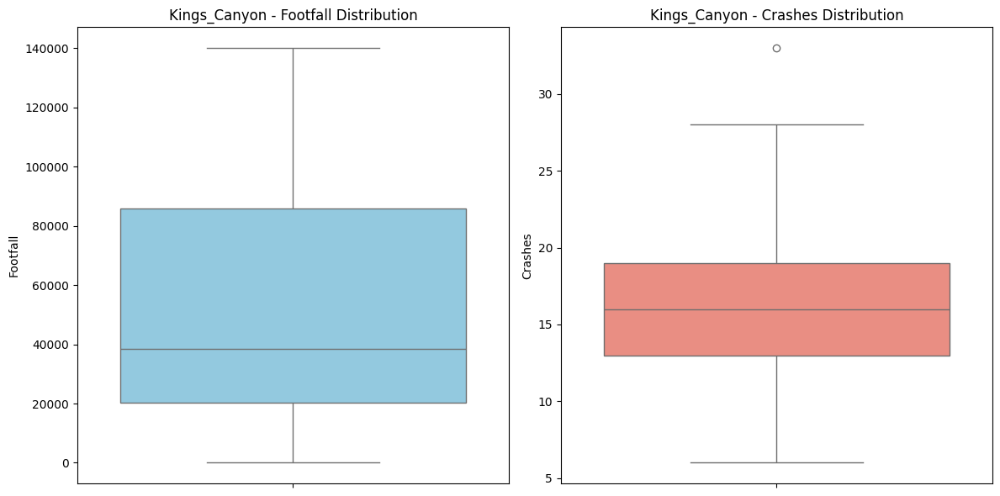

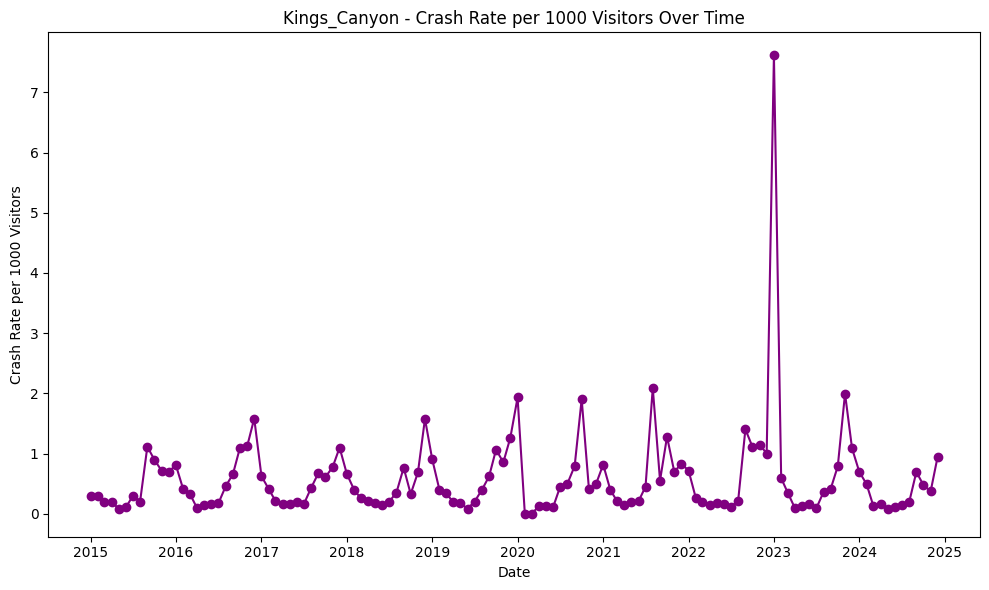


Generating visualizations for: Lassen_Volcanic


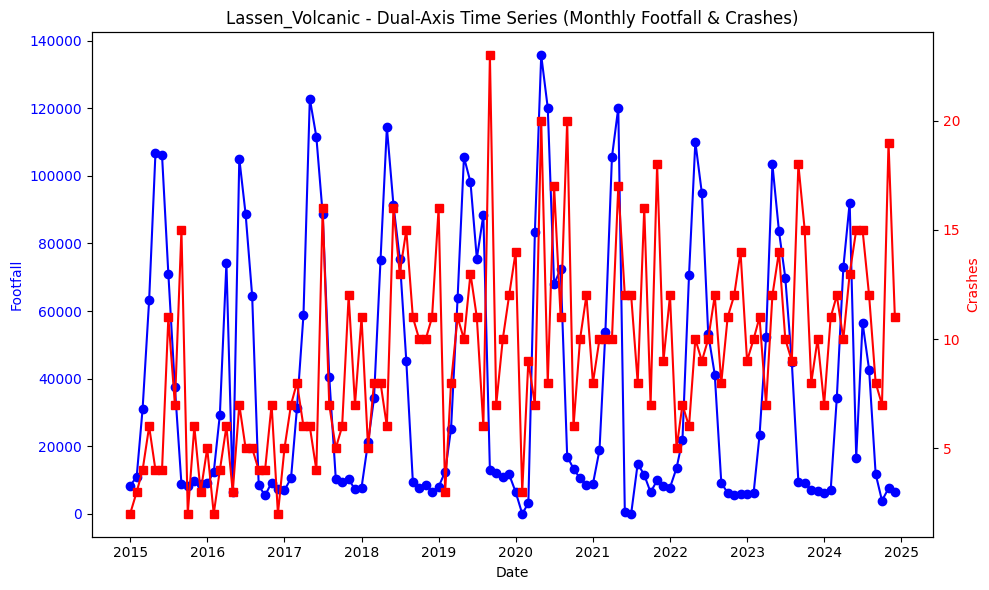

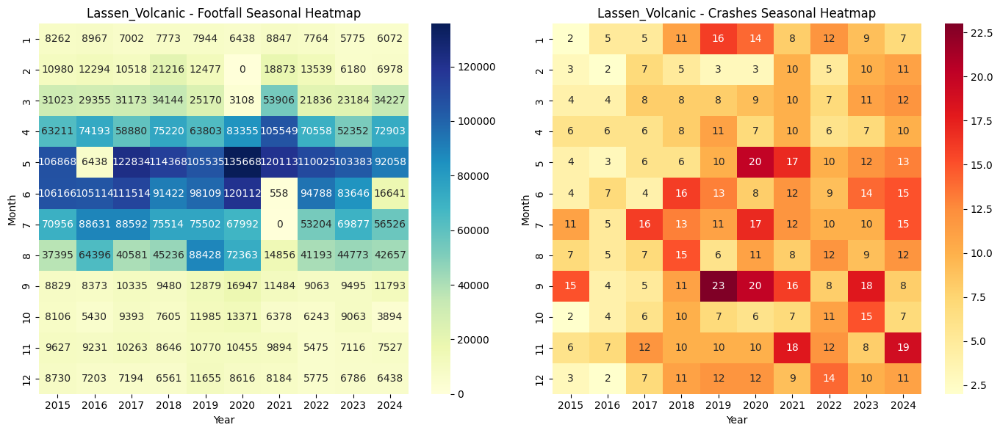

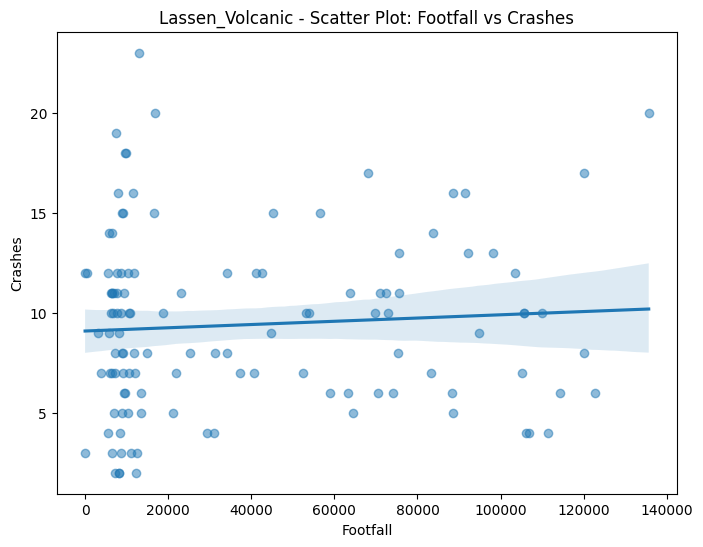

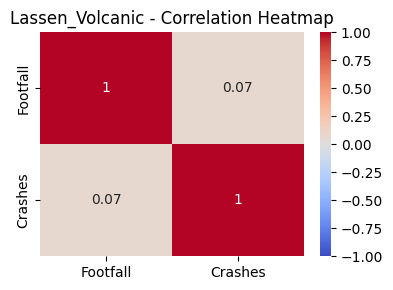

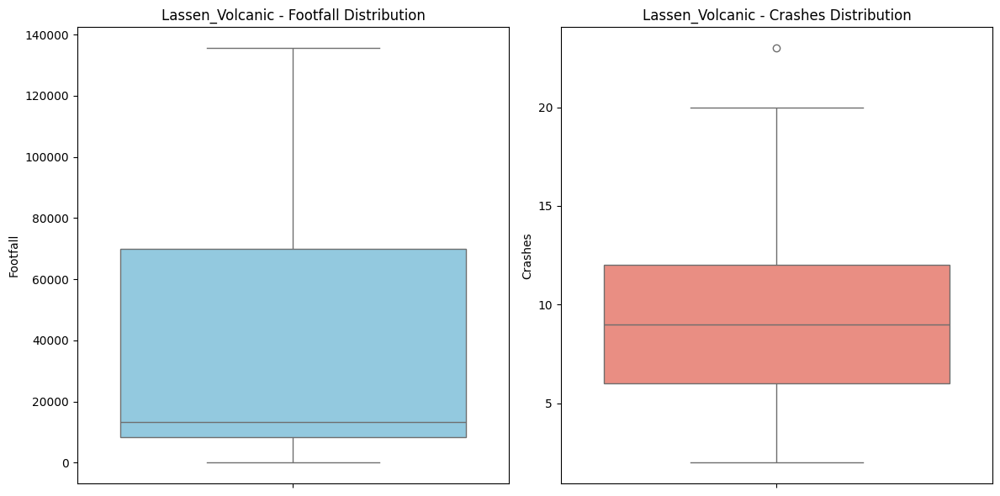

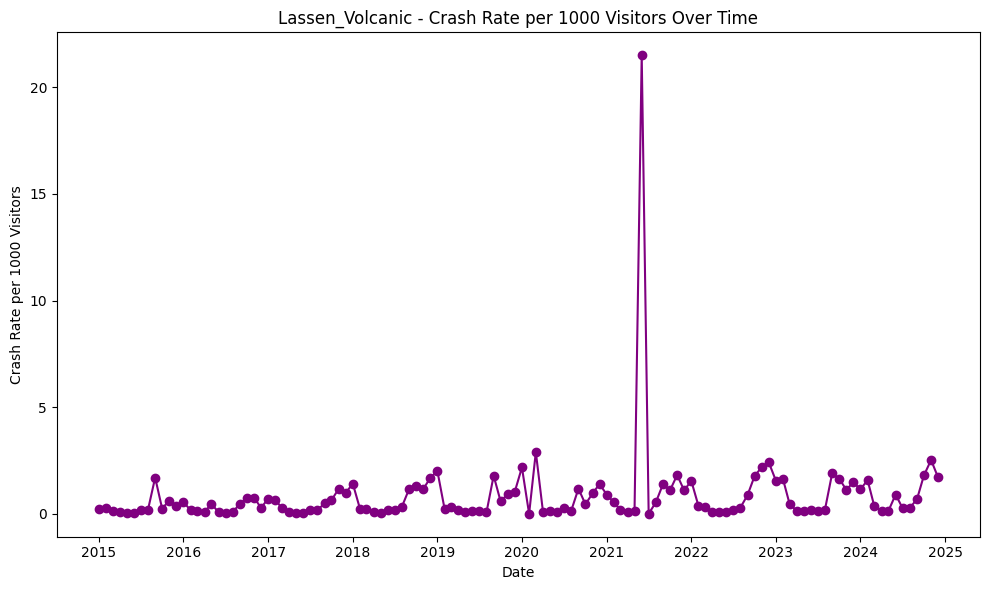


Generating visualizations for: Pinnacles


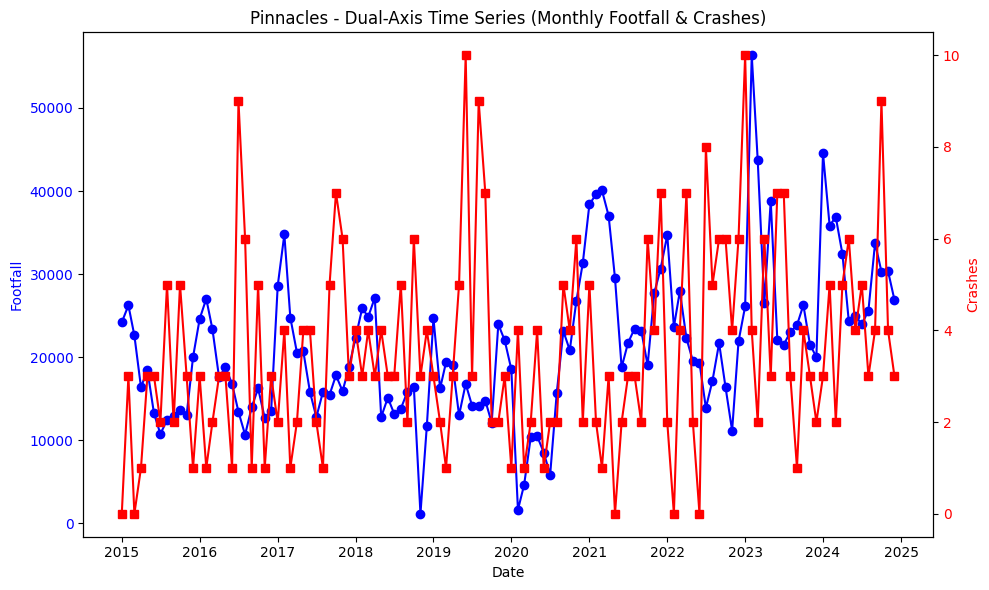

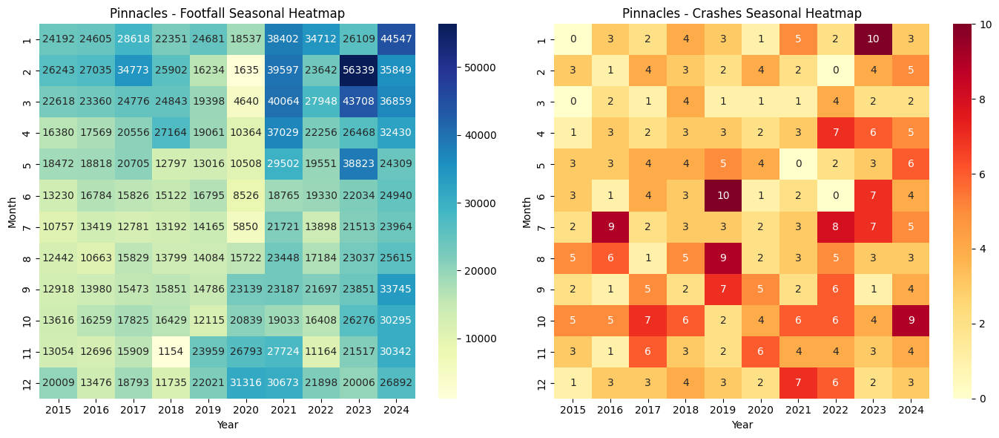

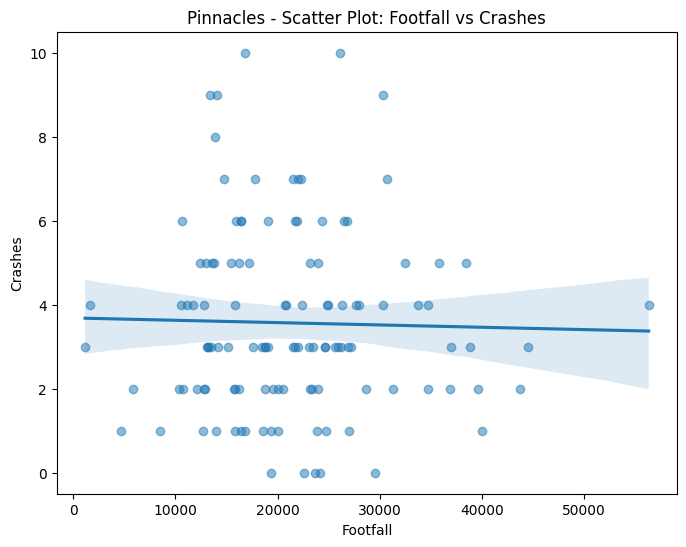

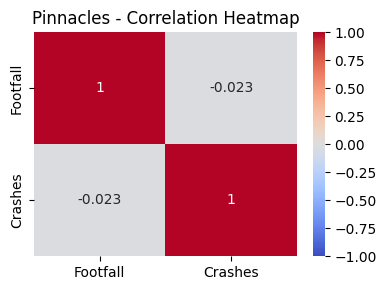

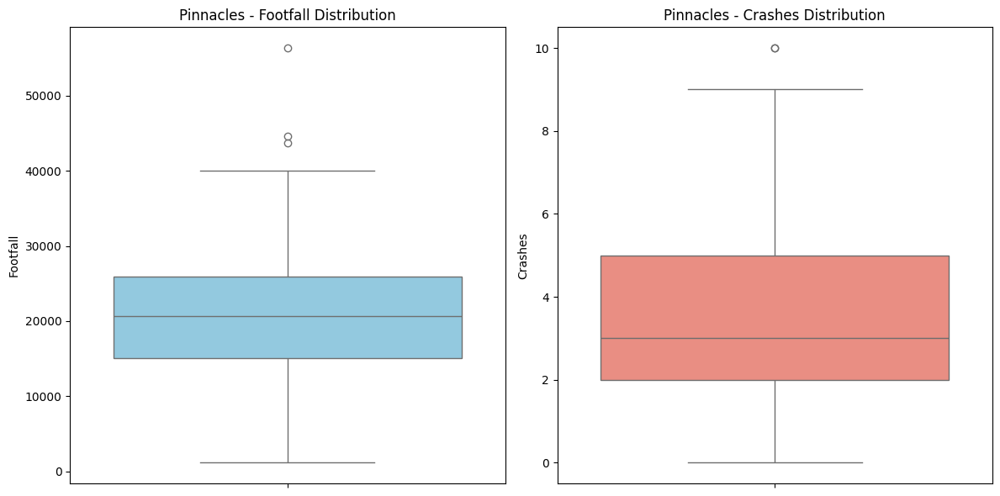

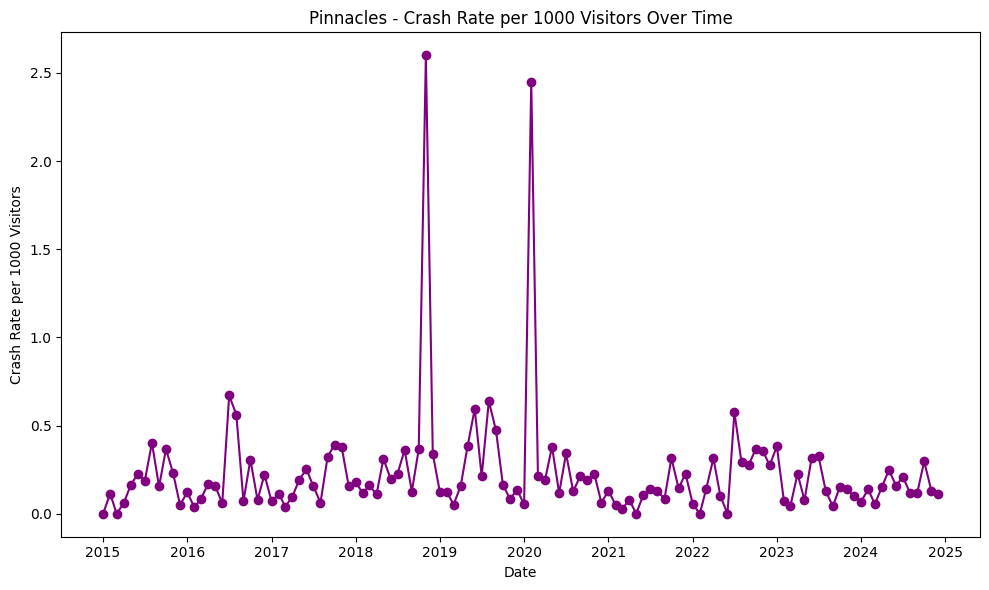


Generating visualizations for: Redwood


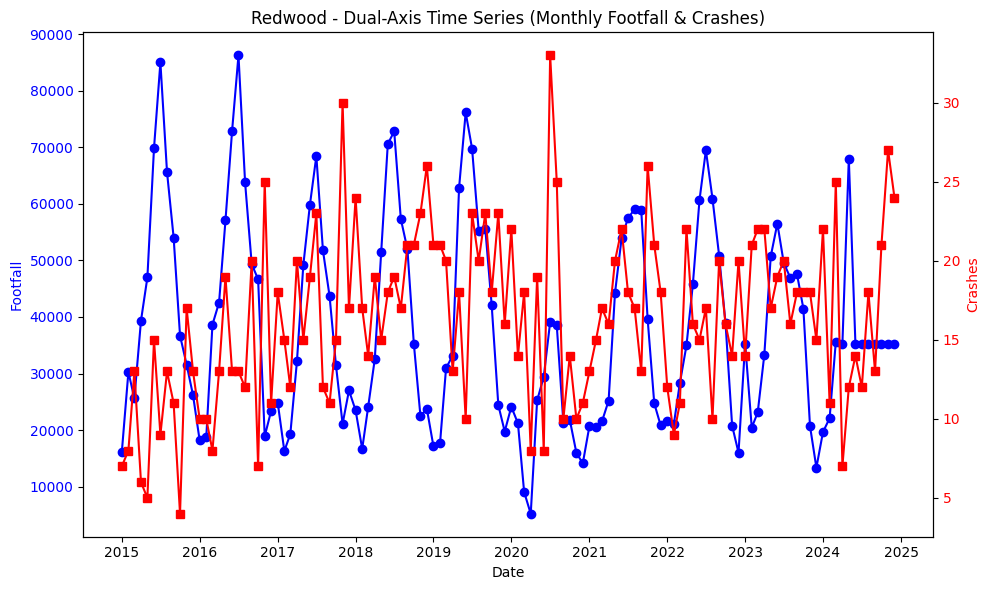

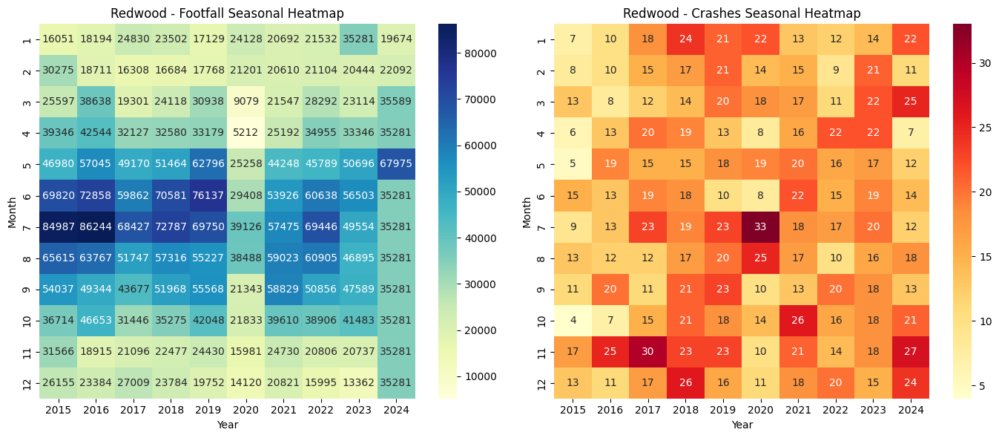

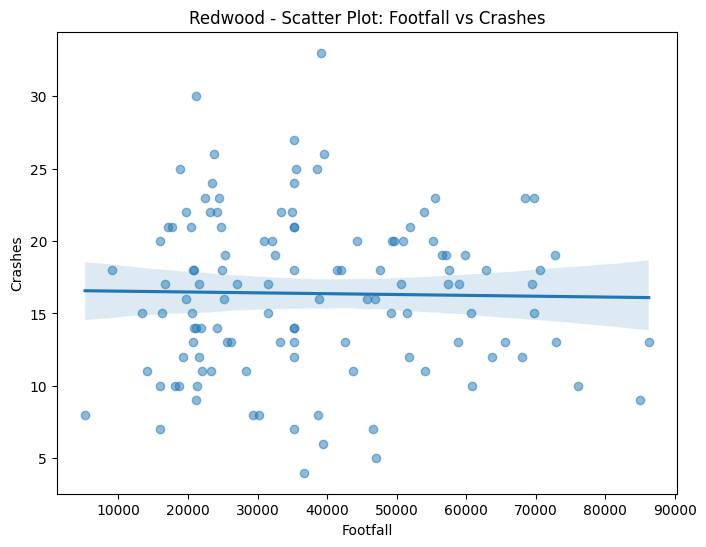

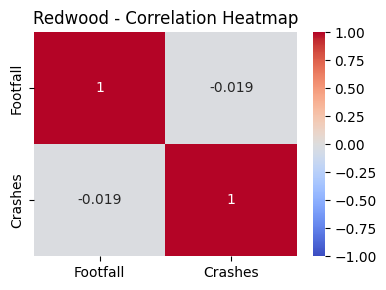

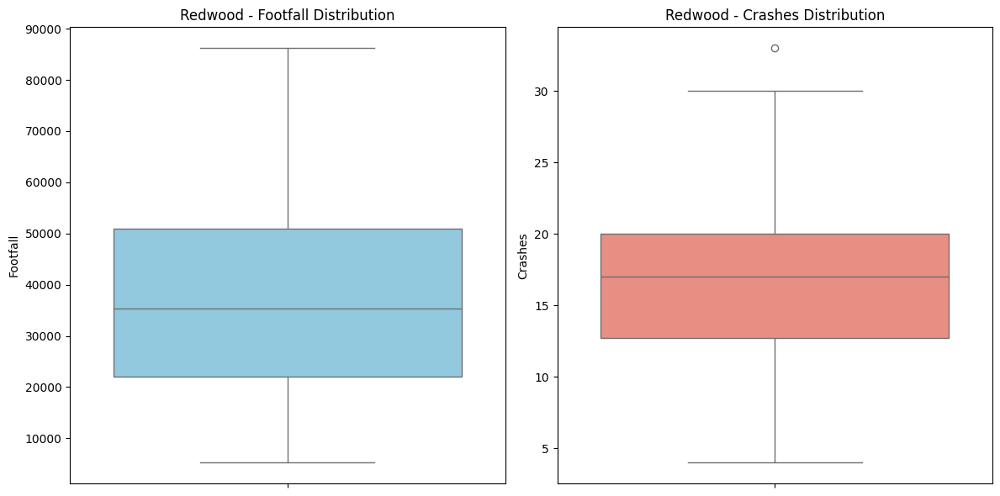

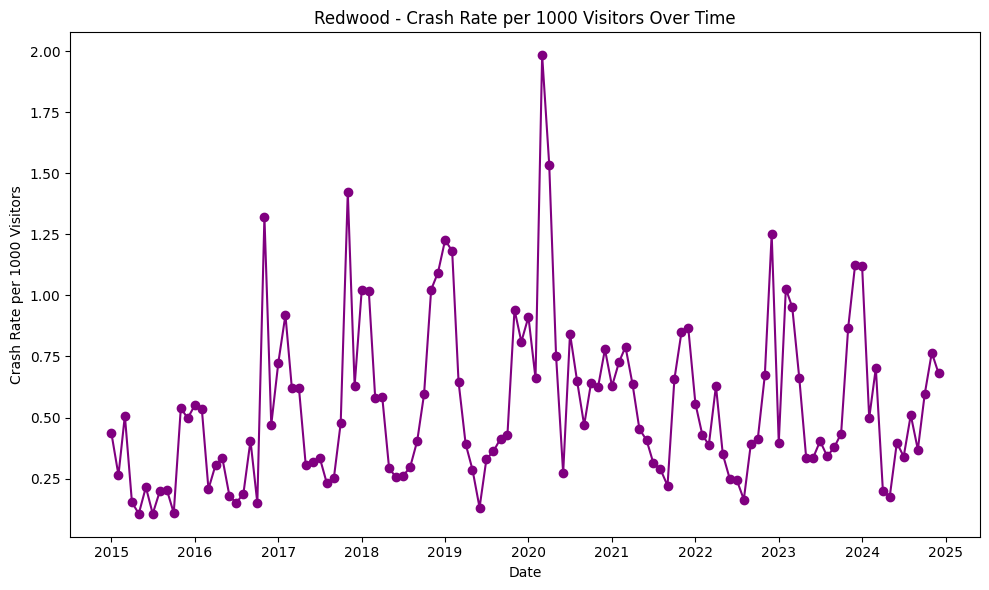


Generating visualizations for: Sequoia


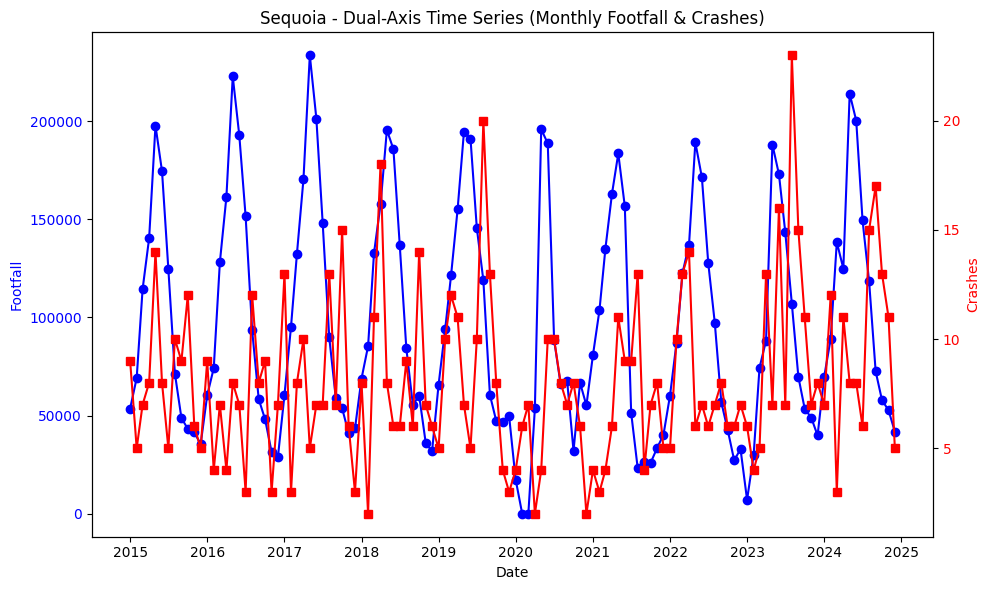

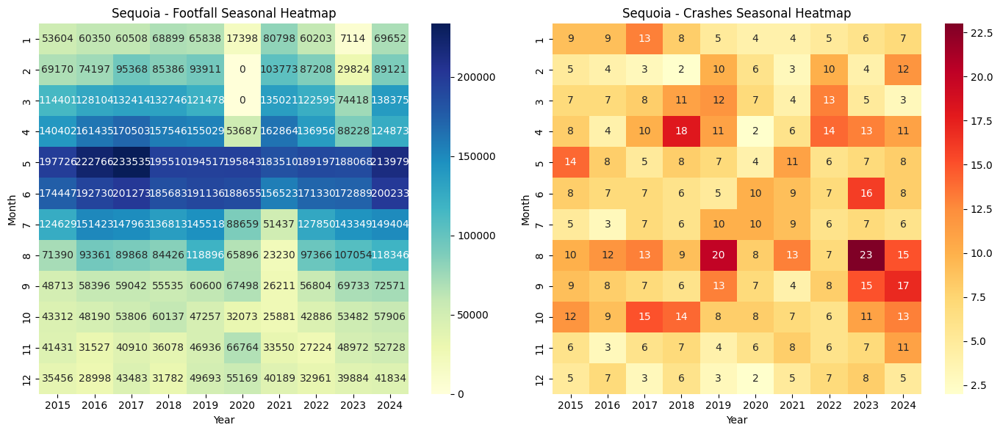

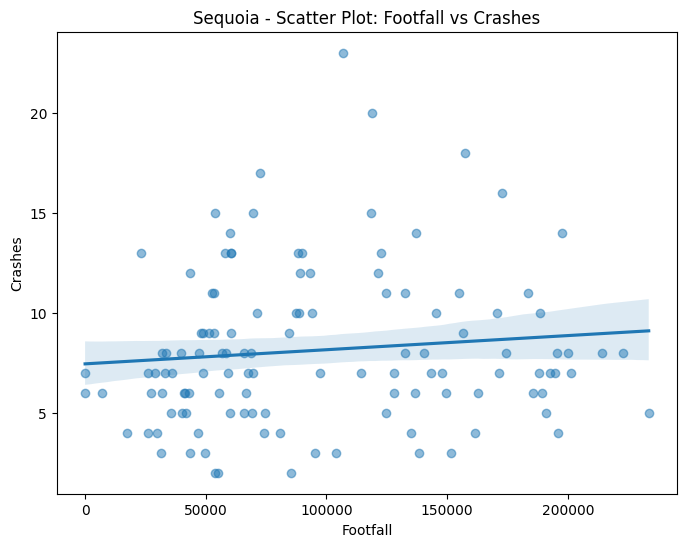

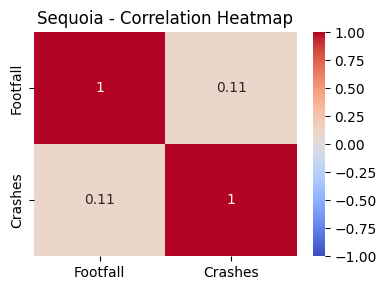

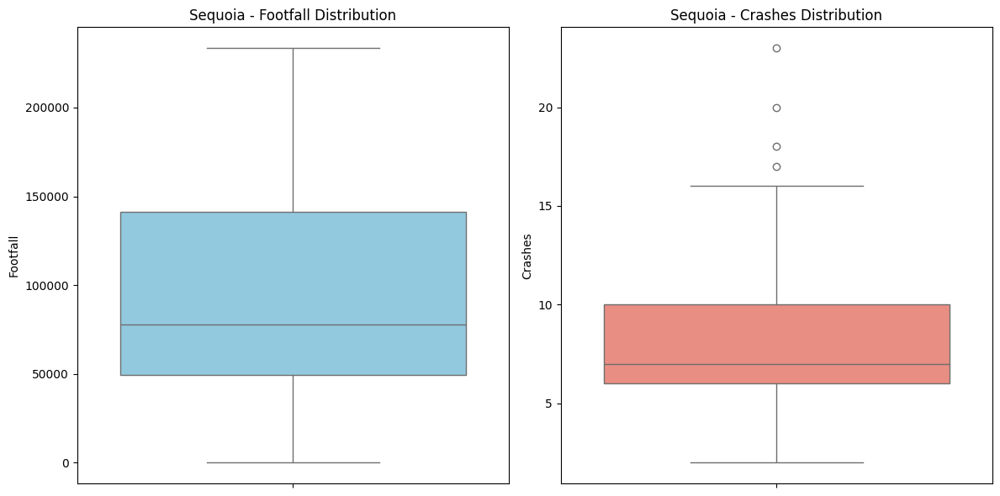

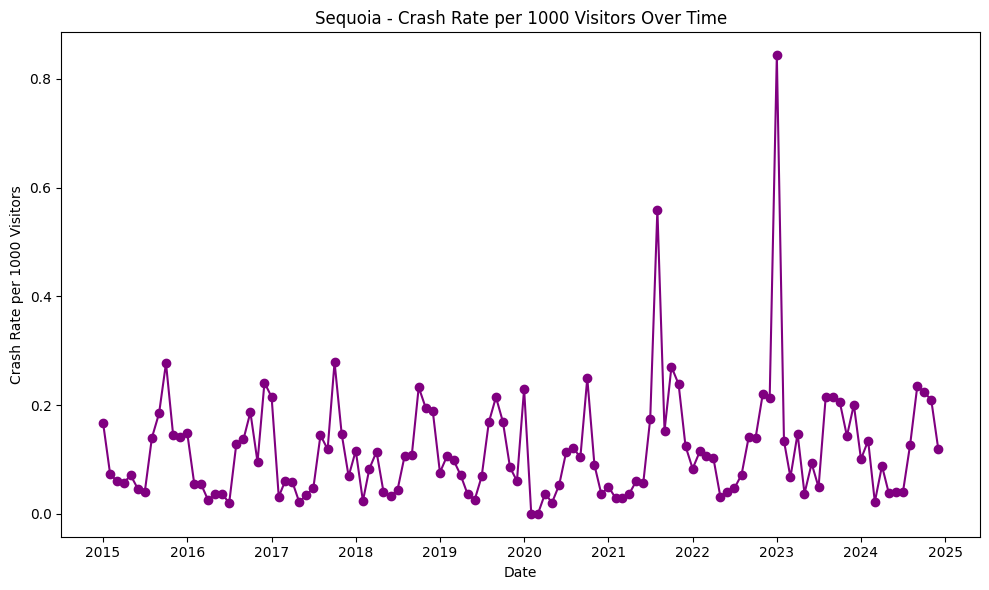


Generating visualizations for: Yosemite


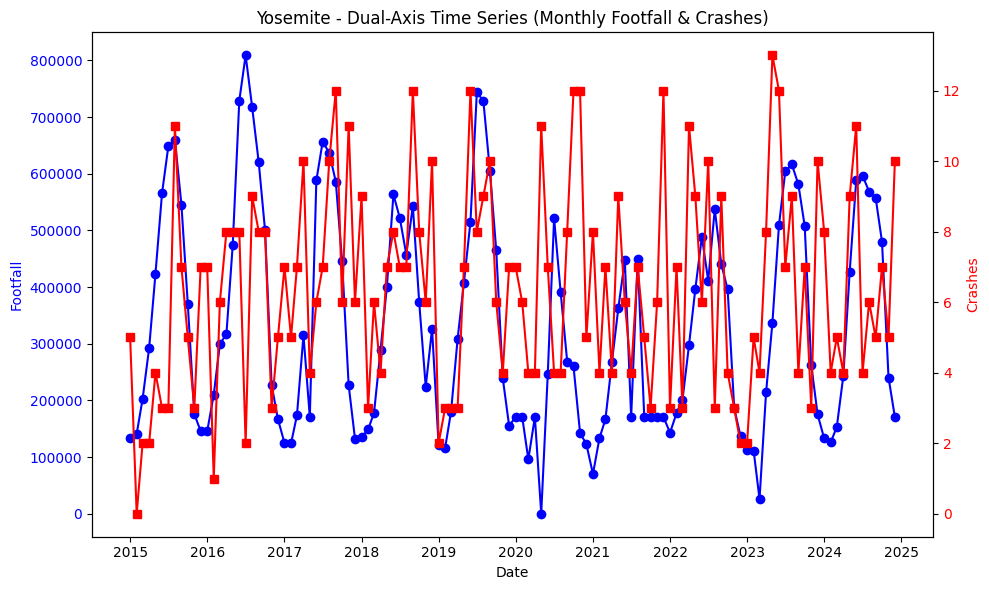

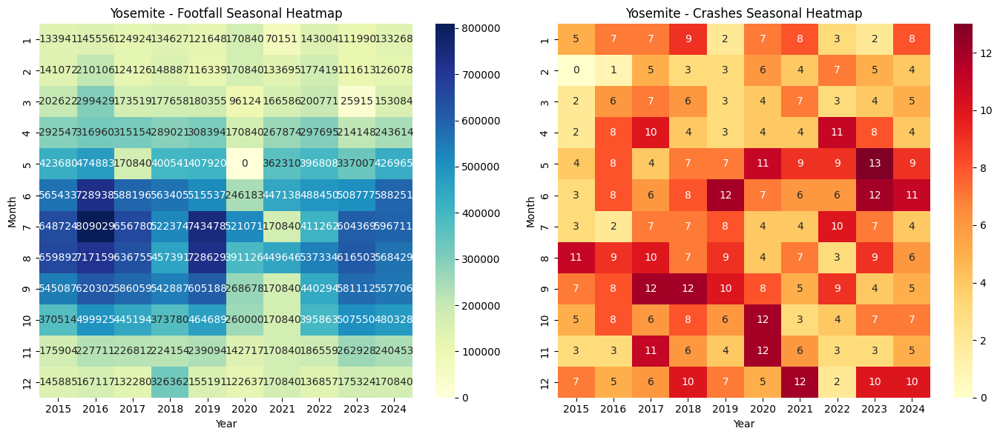

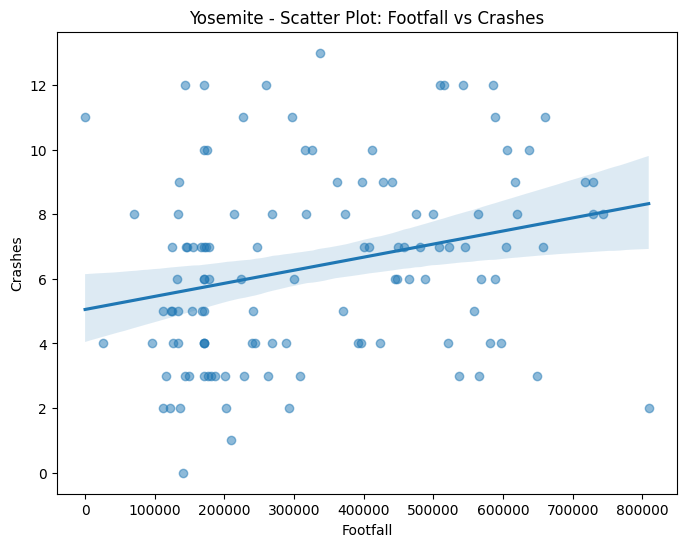

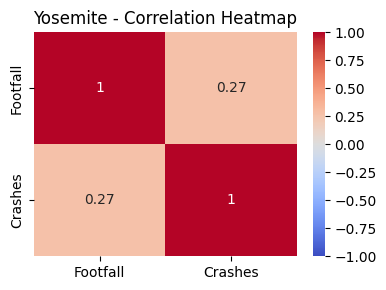

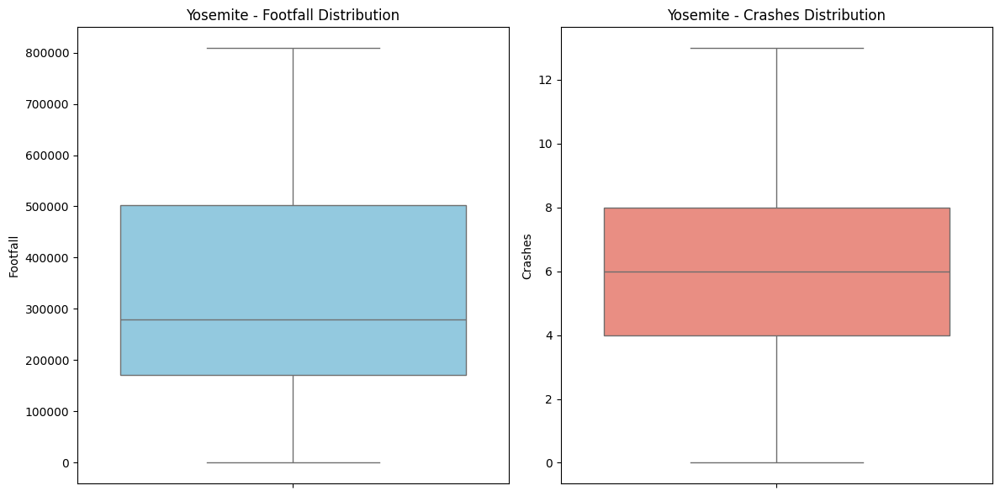

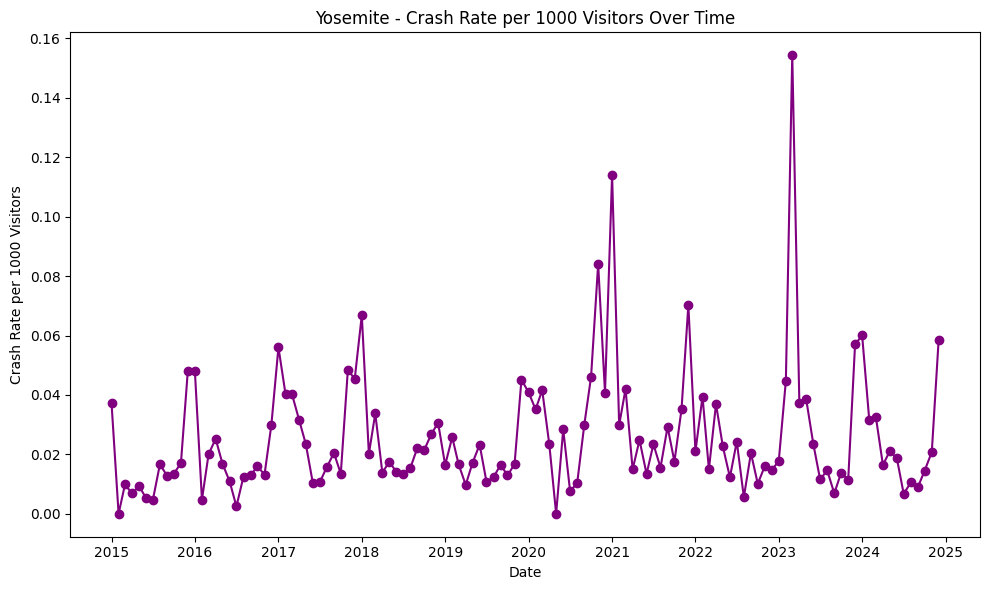

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# ---------------------------
# 1. LOAD AND PREPROCESS DATA
# ---------------------------
# Load datasets (update file paths if needed)
footfall_df = pd.read_csv('/Users/himanshunimonkar/Downloads/STA_220/footfall-stats-california-national-parks_modified.csv')
crashes_df = pd.read_csv('/Users/himanshunimonkar/Downloads/STA_220/crash-data/combined_national_parks_crashes.csv')

# We rename crash columns to match naming conventions.
crashes_df.rename(columns={'ACCIDENT_YEAR': 'Year', 'MONTH': 'Month', 'NATIONAL_PARK': 'National Park'}, inplace=True)

# Create a datetime column in each dataset (using day=1)
footfall_df['Date'] = pd.to_datetime(footfall_df['Year'].astype(str) + '-' + footfall_df['Month'].astype(str) + '-01')
crashes_df['Date'] = pd.to_datetime(crashes_df['Year'].astype(str) + '-' + crashes_df['Month'].astype(str) + '-01')

# ---------------------------
# 2. AGGREGATE THE DATA
# ---------------------------
# Aggregate footfall: sum footfall per park per month
footfall_agg = footfall_df.groupby(['National Park', 'Year', 'Month', 'Date'], as_index=False)['Footfall'].sum()

# Aggregate crashes: count number of crashes per park per month
crashes_agg = crashes_df.groupby(['National Park', 'Year', 'Month', 'Date'], as_index=False).size()
crashes_agg.rename(columns={'size': 'Crashes'}, inplace=True)

# Merge the two on National Park, Year, Month, and Date (outer join to include all records)
merged_df = pd.merge(footfall_agg, crashes_agg, on=['National Park', 'Year', 'Month', 'Date'], how='outer')
merged_df['Footfall'] = merged_df['Footfall'].fillna(0)
merged_df['Crashes'] = merged_df['Crashes'].fillna(0)

# Compute Crash Rate per Visitor (per 1000 visitors)
merged_df['Crash_Rate'] = merged_df.apply(lambda row: (row['Crashes'] / row['Footfall'] * 1000) if row['Footfall'] != 0 else 0, axis=1)

# ---------------------------
# 3. VISUALIZATION LOOP PER NATIONAL PARK
# ---------------------------
# Get the union of parks from the merged data.
parks = merged_df['National Park'].unique()

# Loop over each park to generate individual visualizations
for park in parks:
    # Filter data for the current park and sort by date
    park_data = merged_df[merged_df['National Park'] == park].sort_values('Date')
    
    # Print park name header for clarity
    print(f"\nGenerating visualizations for: {park}\n{'='*50}")
    
    # ----------------------------------------
    # I. TEMPORAL ANALYSIS: Dual-Axis Time Series
    # ----------------------------------------
    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax1.plot(park_data['Date'], park_data['Footfall'], color='blue', marker='o', label='Footfall')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Footfall', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    
    ax2 = ax1.twinx()
    ax2.plot(park_data['Date'], park_data['Crashes'], color='red', marker='s', label='Crashes')
    ax2.set_ylabel('Crashes', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    
    plt.title(f"{park} - Dual-Axis Time Series (Monthly Footfall & Crashes)")
    fig.tight_layout()
    plt.show()
    
    # ----------------------------------------
    # I. TEMPORAL ANALYSIS: Seasonal Patterns (Heatmaps)
    # ----------------------------------------
    # Create pivot tables (rows = Month, columns = Year)
    pivot_footfall = park_data.pivot_table(values='Footfall', index='Month', columns='Year', aggfunc='sum')
    pivot_crashes = park_data.pivot_table(values='Crashes', index='Month', columns='Year', aggfunc='sum')
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    sns.heatmap(pivot_footfall, ax=axes[0], cmap="YlGnBu", annot=True, fmt=".0f")
    axes[0].set_title(f"{park} - Footfall Seasonal Heatmap")
    sns.heatmap(pivot_crashes, ax=axes[1], cmap="YlOrRd", annot=True, fmt=".0f")
    axes[1].set_title(f"{park} - Crashes Seasonal Heatmap")
    plt.tight_layout()
    plt.show()
    
    # ----------------------------------------
    # III. CORRELATION & RELATIONSHIP
    # ----------------------------------------
    # III.1 Scatter Plot Analysis with regression trendline
    fig, ax = plt.subplots(figsize=(8, 6))
    sns.regplot(x='Footfall', y='Crashes', data=park_data, scatter_kws={'alpha': 0.5})
    plt.title(f"{park} - Scatter Plot: Footfall vs Crashes")
    plt.xlabel("Footfall")
    plt.ylabel("Crashes")
    plt.show()
    
    # III.2 Correlation Heatmap (2x2 matrix for Footfall & Crashes)
    corr = park_data[['Footfall', 'Crashes']].corr()
    plt.figure(figsize=(4, 3))
    sns.heatmap(corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
    plt.title(f"{park} - Correlation Heatmap")
    plt.tight_layout()
    plt.show()
    
    # ----------------------------------------
    # V. DISTRIBUTION & VARIABILITY: Boxplots
    # ----------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    sns.boxplot(y=park_data['Footfall'], ax=axes[0], color='skyblue')
    axes[0].set_title(f"{park} - Footfall Distribution")
    sns.boxplot(y=park_data['Crashes'], ax=axes[1], color='salmon')
    axes[1].set_title(f"{park} - Crashes Distribution")
    plt.tight_layout()
    plt.show()
    
    # ----------------------------------------
    # VI. RATIO & IMPACT: Crash Rate per Visitor Over Time
    # ----------------------------------------
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(park_data['Date'], park_data['Crash_Rate'], marker='o', linestyle='-', color='purple')
    ax.set_title(f"{park} - Crash Rate per 1000 Visitors Over Time")
    ax.set_xlabel("Date")
    ax.set_ylabel("Crash Rate per 1000 Visitors")
    plt.tight_layout()
    plt.show()

# End of visualization loop
